# Inerpretation-Net Training

## Specitication of Experiment Settings

In [1]:
#######################################################################################################################################
###################################################### CONFIG FILE ####################################################################
#######################################################################################################################################
sleep_time = 0 #minutes

config = {
    'data': {
        'd': 3, #degree
        'n': 15, #number of variables
        'monomial_vars': None, #int or None
        'laurent': False, #use Laurent polynomials (negative degree with up to -d)  
        'neg_d': 0,#int or None
        'neg_d_prob': 0,
        'sparsity': None,
        'sample_sparsity': 15,
        'x_max': 1,
        'x_min': 0,
        'x_distrib': 'uniform', #'normal', 'uniform', 'beta', 'Gamma', 'laplace'
        'a_max': 1,
        'a_min': -1,
        'lambda_nets_total': 1000,
        'noise': 0,
        'noise_distrib': 'normal', #'normal', 'uniform', 'beta', 'Gamma', 'laplace'
        
        'border_min': 0.2, #needs to be between 0 and (x_max-x_min)/2
        'border_max': 0.4,
        'lower_degree_prob': 0.5,
        'a_zero_prob': 0.25,
        'a_random_prob': 0.1,      
        
        'same_training_all_lambda_nets': False,

        'fixed_seed_lambda_training': True,
        'fixed_initialization_lambda_training': False,
        'number_different_lambda_trainings': 1,
    },
    'lambda_net': {
        'epochs_lambda': 1000,
        'early_stopping_lambda': True,  #if early stopping is used, multi_epoch_analysis is deactivated
        'early_stopping_min_delta_lambda': 1e-4,
        'batch_lambda': 64,
        'dropout': 0,
        'lambda_network_layers': [5*'sample_sparsity'],
        'optimizer_lambda': 'adam',
        'loss_lambda': 'mae',
        'number_of_lambda_weights': None,
        'lambda_dataset_size': 5000,
    },
    'i_net': {
        'optimizer': 'custom',#adam
        'inet_loss': 'mae',
        'inet_metrics': ['r2'],
        'dropout': 0.25,
        'dropout_output': 0,
        'epochs': 1,#5000, 
        'early_stopping': True,
        'batch_size': 256,
        'dense_layers': [512, 1024],
        'convolution_layers': None,
        'lstm_layers': None,
        'interpretation_dataset_size': 1000,
                
        'interpretation_net_output_monomials': 15, #(None, int) #CONSTANT IS NOT INCLUDED
        'interpretation_net_output_shape': None, #calculated automatically later
        'test_size': 100, #Float for fraction, Int for number 0
        
        'normalize_inet_data': False,
        'inet_training_without_noise': True, #dataset size without noise hardcoded to 50k in generate_paths
        'sparse_poly_representation_version': 1, #(1, 2); 1=old, 2=new

        'evaluate_with_real_function': False, #False
        'consider_labels_training': False, #False
                      
        'data_reshape_version': None, #default to 2 options:(None, 0,1 2)
        'nas': False,
        'nas_type': 'SEQUENTIAL', #options:(None, 'SEQUENTIAL', 'CNN', 'LSTM', 'CNN-LSTM', 'CNN-LSTM-parallel')      
        'nas_trials': 100,
    },
    'evaluation': {   
        'inet_holdout_seed_evaluation': False,
        
        #set if multi_epoch_analysis should be performed
        'multi_epoch_analysis': True,
        'each_epochs_save_lambda': 100,
        'epoch_start': 0, #use to skip first epochs in multi_epoch_analysis
        
        #set if samples analysis should be performed
        'samples_list': None,#[100, 500, 750, 1000, 2500, 5000, 7500, 10000, 15000, 20000, 25000, 28125] 
       
        'random_evaluation_dataset_size': 500,
        'per_network_optimization_dataset_size': 500,
        'max_optimization_minutes': 120,
        
        'adjusted_symbolic_metamodeling_code': False,
        'symbolic_metamodeling_evaluation': True,
        'symbolic_metamodeling_poly_evaluation': False,
        'symbolic_metamodeling_function_evaluation': False,
        'symbolic_metamodeling_poly_function_evaluation': False,
        
        'symbolic_regression_evaluation': False,
        'per_network_evaluation': False,
    },
    'computation':{
        'train_model': True,
        'n_jobs': -3,
        'use_gpu': True,
        'gpu_numbers': '2',
        'RANDOM_SEED': 0,   
    }
}

## Imports

In [2]:
#######################################################################################################################################
########################################### IMPORT GLOBAL VARIABLES FROM CONFIG #######################################################
#######################################################################################################################################
globals().update(config['data'])
globals().update(config['lambda_net'])
globals().update(config['i_net'])
globals().update(config['evaluation'])
globals().update(config['computation'])

In [3]:
#######################################################################################################################################
##################################################### IMPORT LIBRARIES ################################################################
#######################################################################################################################################
from itertools import product       
from tqdm import tqdm_notebook as tqdm
import pickle
import numpy as np
import pandas as pd
import scipy as sp
import timeit
import psutil

from functools import reduce
from more_itertools import random_product 
from sklearn.preprocessing import Normalizer

import sys
import os
import shutil

import logging

from prettytable import PrettyTable
import colored
import math

import time
from datetime import datetime
from collections.abc import Iterable


from joblib import Parallel, delayed

from scipy.integrate import quad

from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, KFold, ParameterGrid, ParameterSampler
from sklearn.metrics import accuracy_score, log_loss, roc_auc_score, f1_score, mean_absolute_error, r2_score

from similaritymeasures import frechet_dist, area_between_two_curves, dtw
import tensorflow as tf
import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


import tensorflow.keras.backend as K
from livelossplot import PlotLossesKerasTF
#from keras_tqdm import TQDMNotebookCallback

from matplotlib import pyplot as plt
import seaborn as sns


import random 


import warnings

from IPython.display import Image
from IPython.display import display, Math, Latex, clear_output



In [4]:
tf.__version__

'2.4.1'

In [5]:
#######################################################################################################################################
################################################### VARIABLE ADJUSTMENTS ##############################################################
#######################################################################################################################################
variables = 'abcdefghijklmnopqrstuvwxyz'[:n]

n_jobs = min((epochs_lambda//each_epochs_save_lambda+1, n_jobs)) if multi_epoch_analysis else min(len(samples_list), n_jobs) if samples_list!=None else 1

multi_epoch_analysis = False if early_stopping_lambda else multi_epoch_analysis #deactivate multi_epoch_analysis if early stopping is used

each_epochs_save_lambda = each_epochs_save_lambda if multi_epoch_analysis else epochs_lambda
epochs_save_range_lambda = range(epoch_start//each_epochs_save_lambda, epochs_lambda//each_epochs_save_lambda) if each_epochs_save_lambda == 1 else range(epoch_start//each_epochs_save_lambda, epochs_lambda//each_epochs_save_lambda+1) if multi_epoch_analysis else range(1,2)

data_reshape_version = 2 if data_reshape_version == None and (convolution_layers != None or lstm_layers != None or (nas and nas_type != 'SEQUENTIAL')) else data_reshape_version
#######################################################################################################################################
###################################################### SET VARIABLES + DESIGN #########################################################
#######################################################################################################################################

#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_numbers if use_gpu else ''
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#os.environ['XLA_FLAGS'] =  '--xla_gpu_cuda_data_dir=/usr/lib/cuda-10.1'

logging.getLogger('tensorflow').disabled = True

sns.set_style("darkgrid")
#np.set_printoptions(suppress=True)

random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
if int(tf.__version__[0]) >= 2:
    tf.random.set_seed(RANDOM_SEED)
else:
    tf.set_random_seed(RANDOM_SEED)
    
    
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_columns', 500)

warnings.filterwarnings('ignore')

sys.path.append('..')

In [6]:
from utilities.utility_functions import flatten, rec_gen, gen_monomial_identifier_list

list_of_monomial_identifiers_extended = []

if laurent:
    variable_sets = [list(flatten([[_d for _d in range(d+1)], [-_d for _d in range(1, neg_d+1)]])) for _ in range(n)]
    list_of_monomial_identifiers_extended = rec_gen(variable_sets)    
        
    print('List length: ' + str(len(list_of_monomial_identifiers_extended)))
    #print('Number of monomials in a polynomial with ' + str(n) + ' variables and degree ' + str(d) + ': ' + str(sparsity))
    #print('Sparsity:' + str(sparsity))
    if len(list_of_monomial_identifiers_extended) < 500:
        print(list_of_monomial_identifiers_extended)     
        
    list_of_monomial_identifiers = []
    for monomial_identifier in tqdm(list_of_monomial_identifiers_extended):
        if np.sum(monomial_identifier) <= d:
            if monomial_vars == None or len(list(filter(lambda x: x != 0, monomial_identifier))) <= monomial_vars:
                list_of_monomial_identifiers.append(monomial_identifier)        
else:
    variable_list = ['x'+ str(i) for i in range(n)]
    list_of_monomial_identifiers = gen_monomial_identifier_list(variable_list, d, n)
            
print('List length: ' + str(len(list_of_monomial_identifiers)))
#print('Number of monomials in a polynomial with ' + str(n) + ' variables and degree ' + str(d) + ': ' + str(sparsity))
#print('Sparsity: ' + str(sparsity))
print(list_of_monomial_identifiers)


List length: 816
[[3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,

In [7]:
from utilities.InterpretationNet import *
from utilities.LambdaNet import *
from utilities.metrics import *
from utilities.utility_functions import *
#######################################################################################################################################
####################################################### CONFIG ADJUSTMENTS ############################################################
#######################################################################################################################################
config['evaluation']['multi_epoch_analysis'] = multi_epoch_analysis
config['evaluation']['each_epochs_save_lambda'] = each_epochs_save_lambda
config['i_net']['data_reshape_version'] = data_reshape_version

config['data']['sparsity'] = nCr(config['data']['n']+config['data']['d'], config['data']['d']) if not laurent else len(list_of_monomial_identifiers)
config['data']['sample_sparsity'] = config['data']['sparsity'] if config['data']['sample_sparsity'] == None else config['data']['sample_sparsity']

config['i_net']['interpretation_net_output_shape'] = config['data']['sparsity'] if config['i_net']['interpretation_net_output_monomials'] is None else config['data']['sparsity']*config['i_net']['interpretation_net_output_monomials']+config['i_net']['interpretation_net_output_monomials'] if config['i_net']['sparse_poly_representation_version'] == 1 else config['data']['n']*(config['data']['d']+1)*config['i_net']['interpretation_net_output_monomials']+config['i_net']['interpretation_net_output_monomials']  
print('Output Shape: ', config['i_net']['interpretation_net_output_shape'])

transformed_layers = []
for layer in config['lambda_net']['lambda_network_layers']:
    if type(layer) == str:
        transformed_layers.append(layer.count('sample_sparsity')*config['data']['sample_sparsity'])
    else:
        transformed_layers.append(layer)
config['lambda_net']['lambda_network_layers'] = transformed_layers

layers_with_input_output = list(flatten([[config['data']['n']], config['lambda_net']['lambda_network_layers'], [1]]))
number_of_lambda_weights = 0
for i in range(len(layers_with_input_output)-1):
    number_of_lambda_weights += (layers_with_input_output[i]+1)*layers_with_input_output[i+1]  
config['lambda_net']['number_of_lambda_weights'] = number_of_lambda_weights
    
#######################################################################################################################################
################################################## UPDATE VARIABLES ###################################################################
#######################################################################################################################################
globals().update(config['data'])
globals().update(config['lambda_net'])
globals().update(config['i_net'])
globals().update(config['evaluation'])
globals().update(config['computation'])



initialize_LambdaNet_config_from_curent_notebook(config)
initialize_metrics_config_from_curent_notebook(config)
initialize_utility_functions_config_from_curent_notebook(config)
initialize_InterpretationNet_config_from_curent_notebook(config)


#######################################################################################################################################
###################################################### PATH + FOLDER CREATION #########################################################
#######################################################################################################################################
globals().update(generate_paths(path_type='interpretation_net'))
create_folders_inet()

#######################################################################################################################################
############################################################ SLEEP TIMER ##############################################################
#######################################################################################################################################
sleep_minutes(sleep_time)

Output Shape:  12255


In [8]:
print(path_identifier_interpretation_net_data)

print(path_identifier_lambda_net_data)


inet_dense512-1024-output_12255_drop0.25e1b256_custom/lnets_1000_75-1000e_ES0.0001_64b_adam_mae_train_5000_diffX_1-FixSeed_0/var_15_d_3_negd_0_prob_0_spars_15_amin_-1_amax_1_xdist_uniform_noise_normal_0bmin0.2bmax0.4lowd0.5azero0.25arand0.1
lnets_1000_75-1000e_ES0.0001_64b_adam_mae_train_5000_diffX_1-FixSeed_0/var_15_d_3_negd_0_prob_0_spars_15_amin_-1_amax_1_xdist_uniform_noise_normal_0bmin0.2bmax0.4lowd0.5azero0.25arand0.1


In [9]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("Num XLA-GPUs Available: ", len(tf.config.experimental.list_physical_devices('XLA_GPU')))

Num GPUs Available:  0
Num XLA-GPUs Available:  0


## Load Data and Generate Datasets

In [10]:
def load_lambda_nets(index, no_noise=False):
    
    if psutil.virtual_memory().percent > 80:
        raise SystemExit("Out of RAM!")
    
    path_identifier_lambda_net_data_loading = None 
                
    if no_noise==True:
        path_identifier_lambda_net_data_loading = generate_paths(path_type='interpretation_net_no_noise')['path_identifier_lambda_net_data']
    else:
        path_identifier_lambda_net_data_loading = path_identifier_lambda_net_data 
        
    directory = './data/weights/' + 'weights_' + path_identifier_lambda_net_data_loading + '/'
    path_weights = directory + 'weights_epoch_' + str(index).zfill(3) + '.txt'
    path_X_data = directory + 'lambda_X_test_data.txt'
    path_y_data = directory + 'lambda_y_test_data.txt'        
    
    weight_data = pd.read_csv(path_weights, sep=",", header=None)
    weight_data = weight_data.sort_values(by=0).sample(frac=1, random_state=RANDOM_SEED)
    if no_noise == False:
        weight_data = weight_data.sort_values(by=0).sample(n=interpretation_dataset_size, random_state=RANDOM_SEED)
    
    lambda_X_test_data = pd.read_csv(path_X_data, sep=",", header=None)
    lambda_X_test_data = lambda_X_test_data.sort_values(by=0).sample(frac=1, random_state=RANDOM_SEED)
    if no_noise == False:
        lambda_X_test_data = lambda_X_test_data.sort_values(by=0).sample(n=interpretation_dataset_size, random_state=RANDOM_SEED)
    
    lambda_y_test_data = pd.read_csv(path_y_data, sep=",", header=None)
    lambda_y_test_data = lambda_y_test_data.sort_values(by=0).sample(frac=1, random_state=RANDOM_SEED)
    if no_noise == False:
        lambda_y_test_data = lambda_y_test_data.sort_values(by=0).sample(n=interpretation_dataset_size, random_state=RANDOM_SEED)
        
    lambda_nets = [None] * weight_data.shape[0]
    for i, (row_weights, row_lambda_X_test_data, row_lambda_y_test_data) in enumerate(zip(weight_data.values, lambda_X_test_data.values, lambda_y_test_data.values)):        
        lambda_net = LambdaNet(row_weights, row_lambda_X_test_data, row_lambda_y_test_data)
        lambda_nets[i] = lambda_net
                
    lambda_net_dataset = LambdaNetDataset(lambda_nets)
        
    return lambda_net_dataset
    

In [11]:
#LOAD DATA
if inet_training_without_noise:
    parallel = Parallel(n_jobs=n_jobs, verbose=3, backend='multiprocessing')
    lambda_net_dataset_list_without_noise = parallel(delayed(load_lambda_nets)((i+1)*each_epochs_save_lambda if each_epochs_save_lambda==1 else i*each_epochs_save_lambda if i > 1 else each_epochs_save_lambda if i==1 else 1, no_noise=True) for i in epochs_save_range_lambda)  
    del parallel
    
    parallel = Parallel(n_jobs=n_jobs, verbose=3, backend='multiprocessing')
    lambda_net_dataset_list = parallel(delayed(load_lambda_nets)((i+1)*each_epochs_save_lambda if each_epochs_save_lambda==1 else i*each_epochs_save_lambda if i > 1 else each_epochs_save_lambda if i==1 else 1) for i in epochs_save_range_lambda)  
    del parallel
else:
    parallel = Parallel(n_jobs=n_jobs, verbose=3, backend='multiprocessing')
    lambda_net_dataset_list = parallel(delayed(load_lambda_nets)((i+1)*each_epochs_save_lambda if each_epochs_save_lambda==1 else i*each_epochs_save_lambda if i > 1 else each_epochs_save_lambda if i==1 else 1) for i in epochs_save_range_lambda)  
    del parallel

lambda_net_dataset = lambda_net_dataset_list[-1]


[Parallel(n_jobs=-3)]: Using backend MultiprocessingBackend with 22 concurrent workers.
[Parallel(n_jobs=-3)]: Done   1 out of   1 | elapsed: 21.0min finished
[Parallel(n_jobs=-3)]: Using backend MultiprocessingBackend with 22 concurrent workers.
[Parallel(n_jobs=-3)]: Done   1 out of   1 | elapsed:   27.8s finished


## Data Inspection

In [12]:
lambda_net_dataset.as_pandas().head()

,seed,300000000000000-target,210000000000000-target,201000000000000-target,200100000000000-target,200010000000000-target,200001000000000-target,200000100000000-target,200000010000000-target,200000001000000-target,200000000100000-target,200000000010000-target,200000000001000-target,200000000000100-target,200000000000010-target,200000000000001-target,200000000000000-target,120000000000000-target,111000000000000-target,110100000000000-target,110010000000000-target,110001000000000-target,110000100000000-target,110000010000000-target,110000001000000-target,110000000100000-target,110000000010000-target,110000000001000-target,110000000000100-target,110000000000010-target,110000000000001-target,110000000000000-target,102000000000000-target,101100000000000-target,101010000000000-target,101001000000000-target,101000100000000-target,101000010000000-target,101000001000000-target,101000000100000-target,101000000010000-target,101000000001000-target,101000000000100-target,101000000000010-target,101000000000001-target,101000000000000-target,100200000000000-target,100110000000000-target,100101000000000-target,100100100000000-target,100100010000000-target,100100001000000-target,100100000100000-target,100100000010000-target,100100000001000-target,100100000000100-target,100100000000010-target,100100000000001-target,100100000000000-target,100020000000000-target,100011000000000-target,100010100000000-target,100010010000000-target,100010001000000-target,100010000100000-target,100010000010000-target,100010000001000-target,100010000000100-target,100010000000010-target,100010000000001-target,100010000000000-target,100002000000000-target,100001100000000-target,100001010000000-target,100001001000000-target,100001000100000-target,100001000010000-target,100001000001000-target,100001000000100-target,100001000000010-target,100001000000001-target,100001000000000-target,100000200000000-target,100000110000000-target,100000101000000-target,100000100100000-target,100000100010000-target,100000100001000-target,100000100000100-target,100000100000010-target,100000100000001-target,100000100000000-target,100000020000000-target,100000011000000-target,100000010100000-target,100000010010000-target,100000010001000-target,100000010000100-target,100000010000010-target,100000010000001-target,100000010000000-target,100000002000000-target,100000001100000-target,100000001010000-target,100000001001000-target,100000001000100-target,100000001000010-target,100000001000001-target,100000001000000-target,100000000200000-target,100000000110000-target,100000000101000-target,100000000100100-target,100000000100010-target,100000000100001-target,100000000100000-target,100000000020000-target,100000000011000-target,100000000010100-target,100000000010010-target,100000000010001-target,100000000010000-target,100000000002000-target,100000000001100-target,100000000001010-target,100000000001001-target,100000000001000-target,100000000000200-target,100000000000110-target,100000000000101-target,100000000000100-target,100000000000020-target,100000000000011-target,100000000000010-target,100000000000002-target,100000000000001-target,100000000000000-target,030000000000000-target,021000000000000-target,020100000000000-target,020010000000000-target,020001000000000-target,020000100000000-target,020000010000000-target,020000001000000-target,020000000100000-target,020000000010000-target,020000000001000-target,020000000000100-target,020000000000010-target,020000000000001-target,020000000000000-target,012000000000000-target,011100000000000-target,011010000000000-target,011001000000000-target,011000100000000-target,011000010000000-target,011000001000000-target,011000000100000-target,011000000010000-target,011000000001000-target,011000000000100-target,011000000000010-target,011000000000001-target,011000000000000-target,010200000000000-target,010110000000000-target,010101000000000-target,010100100000000-target,010100010000000-target,010100001000000-target,010100000100000-target,010100000010000-target,010100000001000

In [13]:
lambda_net_dataset.as_pandas().describe()

,seed,300000000000000-target,210000000000000-target,201000000000000-target,200100000000000-target,200010000000000-target,200001000000000-target,200000100000000-target,200000010000000-target,200000001000000-target,200000000100000-target,200000000010000-target,200000000001000-target,200000000000100-target,200000000000010-target,200000000000001-target,200000000000000-target,120000000000000-target,111000000000000-target,110100000000000-target,110010000000000-target,110001000000000-target,110000100000000-target,110000010000000-target,110000001000000-target,110000000100000-target,110000000010000-target,110000000001000-target,110000000000100-target,110000000000010-target,110000000000001-target,110000000000000-target,102000000000000-target,101100000000000-target,101010000000000-target,101001000000000-target,101000100000000-target,101000010000000-target,101000001000000-target,101000000100000-target,101000000010000-target,101000000001000-target,101000000000100-target,101000000000010-target,101000000000001-target,101000000000000-target,100200000000000-target,100110000000000-target,100101000000000-target,100100100000000-target,100100010000000-target,100100001000000-target,100100000100000-target,100100000010000-target,100100000001000-target,100100000000100-target,100100000000010-target,100100000000001-target,100100000000000-target,100020000000000-target,100011000000000-target,100010100000000-target,100010010000000-target,100010001000000-target,100010000100000-target,100010000010000-target,100010000001000-target,100010000000100-target,100010000000010-target,100010000000001-target,100010000000000-target,100002000000000-target,100001100000000-target,100001010000000-target,100001001000000-target,100001000100000-target,100001000010000-target,100001000001000-target,100001000000100-target,100001000000010-target,100001000000001-target,100001000000000-target,100000200000000-target,100000110000000-target,100000101000000-target,100000100100000-target,100000100010000-target,100000100001000-target,100000100000100-target,100000100000010-target,100000100000001-target,100000100000000-target,100000020000000-target,100000011000000-target,100000010100000-target,100000010010000-target,100000010001000-target,100000010000100-target,100000010000010-target,100000010000001-target,100000010000000-target,100000002000000-target,100000001100000-target,100000001010000-target,100000001001000-target,100000001000100-target,100000001000010-target,100000001000001-target,100000001000000-target,100000000200000-target,100000000110000-target,100000000101000-target,100000000100100-target,100000000100010-target,100000000100001-target,100000000100000-target,100000000020000-target,100000000011000-target,100000000010100-target,100000000010010-target,100000000010001-target,100000000010000-target,100000000002000-target,100000000001100-target,100000000001010-target,100000000001001-target,100000000001000-target,100000000000200-target,100000000000110-target,100000000000101-target,100000000000100-target,100000000000020-target,100000000000011-target,100000000000010-target,100000000000002-target,100000000000001-target,100000000000000-target,030000000000000-target,021000000000000-target,020100000000000-target,020010000000000-target,020001000000000-target,020000100000000-target,020000010000000-target,020000001000000-target,020000000100000-target,020000000010000-target,020000000001000-target,020000000000100-target,020000000000010-target,020000000000001-target,020000000000000-target,012000000000000-target,011100000000000-target,011010000000000-target,011001000000000-target,011000100000000-target,011000010000000-target,011000001000000-target,011000000100000-target,011000000010000-target,011000000001000-target,011000000000100-target,011000000000010-target,011000000000001-target,011000000000000-target,010200000000000-target,010110000000000-target,010101000000000-target,010100100000000-target,010100010000000-target,010100001000000-target,010100000100000-target,010100000010000-target,010100000001000

In [14]:
lambda_net_dataset.X_test_data_list[0][:10]

array([[9.37110222e-01, 8.83648749e-01, 4.96804745e-01, 5.59943857e-01,
        9.02179278e-01, 4.87186580e-01, 5.45606949e-01, 8.18958919e-01,
        7.97394988e-01, 1.77492832e-01, 1.21840222e-01, 2.28827901e-01,
        6.10980996e-01, 6.33430107e-01, 9.32754130e-01],
       [6.42024168e-01, 1.33060632e-01, 1.63918348e-01, 3.16005955e-01,
        9.43551189e-01, 9.12659915e-01, 2.67276061e-01, 1.30242839e-01,
        4.91613934e-01, 1.35404061e-01, 1.20969604e-01, 2.27636318e-01,
        5.50849677e-01, 3.19325276e-01, 1.55711709e-01],
       [1.73177204e-01, 1.90241318e-01, 3.41781360e-01, 1.81728361e-01,
        8.68941556e-01, 1.24941476e-01, 4.98519002e-01, 4.13184017e-01,
        9.03054368e-01, 5.12577715e-01, 4.18024028e-02, 7.77909028e-01,
        3.82614993e-01, 2.65397037e-01, 3.54750497e-01],
       [9.93583665e-01, 4.12574170e-01, 7.53920737e-01, 9.44973664e-01,
        6.45039049e-01, 3.47842965e-01, 1.30816928e-01, 7.19896565e-01,
        5.37825701e-01, 7.27190460e-0

In [15]:
lambda_net_dataset.y_test_data_list[0][:10]

array([[-0.68669373],
       [ 0.07379235],
       [-0.0459883 ],
       [ 0.08450431],
       [-1.02805424],
       [-0.22788578],
       [-0.20118038],
       [ 0.10401569],
       [ 0.15591361],
       [-0.09762228]])

## Generate Datasets for Interpretation-Net training

In [16]:
#generate train, test and validation data for training

lambda_net_train_dataset_list = []
lambda_net_valid_dataset_list = []
lambda_net_test_dataset_list = []


if inet_training_without_noise:
   
    for lambda_net_dataset, lambda_net_dataset_without_noise in zip(lambda_net_dataset_list, lambda_net_dataset_list_without_noise):
        if inet_holdout_seed_evaluation:
            raise SystemExit('Holdout Evaluation not implemented with inet training without noise')
            
        else:
            lambda_net_train_dataset, lambda_net_valid_dataset = split_LambdaNetDataset(lambda_net_dataset_without_noise, test_split=0.1)

            _, lambda_net_test_dataset = split_LambdaNetDataset(lambda_net_dataset, test_split=test_size)

            lambda_net_train_dataset_list.append(lambda_net_train_dataset)
            lambda_net_valid_dataset_list.append(lambda_net_valid_dataset)
            lambda_net_test_dataset_list.append(lambda_net_test_dataset)

            del lambda_net_dataset, lambda_net_dataset_list_without_noise
        
else:

    for lambda_net_dataset in lambda_net_dataset_list:

        if inet_holdout_seed_evaluation:

            complete_seed_list = list(set(lambda_net_dataset.train_settings_list['seed']))#list(weight_data.iloc[:,1].unique())

            random.seed(RANDOM_SEED)

            if isinstance(test_size, float):
                test_size = int(len(complete_seed_list)-len(complete_seed_list)/(1/(1-test_size)))

            test_seeds = random.sample(complete_seed_list, test_size)
            lambda_net_test_dataset = lambda_net_dataset.get_lambda_nets_by_seed(test_seeds)
            complete_seed_list = list(set(complete_seed_list) - set(test_seeds))#complete_seed_list.remove(test_seeds)

            random.seed(RANDOM_SEED)
            valid_seeds = random.sample(complete_seed_list, int(len(complete_seed_list)-len(complete_seed_list)/(1/(1-0.1))))
            lambda_net_valid_dataset = lambda_net_dataset.get_lambda_nets_by_seed(valid_seeds)
            complete_seed_list = list(set(complete_seed_list) - set(valid_seeds))

            train_seeds = complete_seed_list
            lambda_net_train_dataset = lambda_net_dataset.get_lambda_nets_by_seed(train_seeds)       

            lambda_net_train_dataset_list.append(lambda_net_train_dataset)
            lambda_net_valid_dataset_list.append(lambda_net_valid_dataset)
            lambda_net_test_dataset_list.append(lambda_net_test_dataset)

            del lambda_net_dataset
        else:

            lambda_net_train_with_valid_dataset, lambda_net_test_dataset = split_LambdaNetDataset(lambda_net_dataset, test_split=test_size)
            lambda_net_train_dataset, lambda_net_valid_dataset = split_LambdaNetDataset(lambda_net_train_with_valid_dataset, test_split=0.1)

            lambda_net_train_dataset_list.append(lambda_net_train_dataset)
            lambda_net_valid_dataset_list.append(lambda_net_valid_dataset)
            lambda_net_test_dataset_list.append(lambda_net_test_dataset)

            del lambda_net_dataset, lambda_net_train_with_valid_dataset


del lambda_net_dataset_list

In [17]:
lambda_net_train_dataset_list[-1].as_pandas().shape

(45000, 3725)

In [18]:
lambda_net_valid_dataset_list[-1].as_pandas().shape

(5000, 3725)

In [19]:
lambda_net_test_dataset_list[-1].as_pandas().shape

(100, 3725)

In [20]:
lambda_net_train_dataset_list[-1].as_pandas().head()

,seed,300000000000000-target,210000000000000-target,201000000000000-target,200100000000000-target,200010000000000-target,200001000000000-target,200000100000000-target,200000010000000-target,200000001000000-target,200000000100000-target,200000000010000-target,200000000001000-target,200000000000100-target,200000000000010-target,200000000000001-target,200000000000000-target,120000000000000-target,111000000000000-target,110100000000000-target,110010000000000-target,110001000000000-target,110000100000000-target,110000010000000-target,110000001000000-target,110000000100000-target,110000000010000-target,110000000001000-target,110000000000100-target,110000000000010-target,110000000000001-target,110000000000000-target,102000000000000-target,101100000000000-target,101010000000000-target,101001000000000-target,101000100000000-target,101000010000000-target,101000001000000-target,101000000100000-target,101000000010000-target,101000000001000-target,101000000000100-target,101000000000010-target,101000000000001-target,101000000000000-target,100200000000000-target,100110000000000-target,100101000000000-target,100100100000000-target,100100010000000-target,100100001000000-target,100100000100000-target,100100000010000-target,100100000001000-target,100100000000100-target,100100000000010-target,100100000000001-target,100100000000000-target,100020000000000-target,100011000000000-target,100010100000000-target,100010010000000-target,100010001000000-target,100010000100000-target,100010000010000-target,100010000001000-target,100010000000100-target,100010000000010-target,100010000000001-target,100010000000000-target,100002000000000-target,100001100000000-target,100001010000000-target,100001001000000-target,100001000100000-target,100001000010000-target,100001000001000-target,100001000000100-target,100001000000010-target,100001000000001-target,100001000000000-target,100000200000000-target,100000110000000-target,100000101000000-target,100000100100000-target,100000100010000-target,100000100001000-target,100000100000100-target,100000100000010-target,100000100000001-target,100000100000000-target,100000020000000-target,100000011000000-target,100000010100000-target,100000010010000-target,100000010001000-target,100000010000100-target,100000010000010-target,100000010000001-target,100000010000000-target,100000002000000-target,100000001100000-target,100000001010000-target,100000001001000-target,100000001000100-target,100000001000010-target,100000001000001-target,100000001000000-target,100000000200000-target,100000000110000-target,100000000101000-target,100000000100100-target,100000000100010-target,100000000100001-target,100000000100000-target,100000000020000-target,100000000011000-target,100000000010100-target,100000000010010-target,100000000010001-target,100000000010000-target,100000000002000-target,100000000001100-target,100000000001010-target,100000000001001-target,100000000001000-target,100000000000200-target,100000000000110-target,100000000000101-target,100000000000100-target,100000000000020-target,100000000000011-target,100000000000010-target,100000000000002-target,100000000000001-target,100000000000000-target,030000000000000-target,021000000000000-target,020100000000000-target,020010000000000-target,020001000000000-target,020000100000000-target,020000010000000-target,020000001000000-target,020000000100000-target,020000000010000-target,020000000001000-target,020000000000100-target,020000000000010-target,020000000000001-target,020000000000000-target,012000000000000-target,011100000000000-target,011010000000000-target,011001000000000-target,011000100000000-target,011000010000000-target,011000001000000-target,011000000100000-target,011000000010000-target,011000000001000-target,011000000000100-target,011000000000010-target,011000000000001-target,011000000000000-target,010200000000000-target,010110000000000-target,010101000000000-target,010100100000000-target,010100010000000-target,010100001000000-target,010100000100000-target,010100000010000-target,010100000001000

In [21]:
lambda_net_valid_dataset_list[-1].as_pandas().head()

,seed,300000000000000-target,210000000000000-target,201000000000000-target,200100000000000-target,200010000000000-target,200001000000000-target,200000100000000-target,200000010000000-target,200000001000000-target,200000000100000-target,200000000010000-target,200000000001000-target,200000000000100-target,200000000000010-target,200000000000001-target,200000000000000-target,120000000000000-target,111000000000000-target,110100000000000-target,110010000000000-target,110001000000000-target,110000100000000-target,110000010000000-target,110000001000000-target,110000000100000-target,110000000010000-target,110000000001000-target,110000000000100-target,110000000000010-target,110000000000001-target,110000000000000-target,102000000000000-target,101100000000000-target,101010000000000-target,101001000000000-target,101000100000000-target,101000010000000-target,101000001000000-target,101000000100000-target,101000000010000-target,101000000001000-target,101000000000100-target,101000000000010-target,101000000000001-target,101000000000000-target,100200000000000-target,100110000000000-target,100101000000000-target,100100100000000-target,100100010000000-target,100100001000000-target,100100000100000-target,100100000010000-target,100100000001000-target,100100000000100-target,100100000000010-target,100100000000001-target,100100000000000-target,100020000000000-target,100011000000000-target,100010100000000-target,100010010000000-target,100010001000000-target,100010000100000-target,100010000010000-target,100010000001000-target,100010000000100-target,100010000000010-target,100010000000001-target,100010000000000-target,100002000000000-target,100001100000000-target,100001010000000-target,100001001000000-target,100001000100000-target,100001000010000-target,100001000001000-target,100001000000100-target,100001000000010-target,100001000000001-target,100001000000000-target,100000200000000-target,100000110000000-target,100000101000000-target,100000100100000-target,100000100010000-target,100000100001000-target,100000100000100-target,100000100000010-target,100000100000001-target,100000100000000-target,100000020000000-target,100000011000000-target,100000010100000-target,100000010010000-target,100000010001000-target,100000010000100-target,100000010000010-target,100000010000001-target,100000010000000-target,100000002000000-target,100000001100000-target,100000001010000-target,100000001001000-target,100000001000100-target,100000001000010-target,100000001000001-target,100000001000000-target,100000000200000-target,100000000110000-target,100000000101000-target,100000000100100-target,100000000100010-target,100000000100001-target,100000000100000-target,100000000020000-target,100000000011000-target,100000000010100-target,100000000010010-target,100000000010001-target,100000000010000-target,100000000002000-target,100000000001100-target,100000000001010-target,100000000001001-target,100000000001000-target,100000000000200-target,100000000000110-target,100000000000101-target,100000000000100-target,100000000000020-target,100000000000011-target,100000000000010-target,100000000000002-target,100000000000001-target,100000000000000-target,030000000000000-target,021000000000000-target,020100000000000-target,020010000000000-target,020001000000000-target,020000100000000-target,020000010000000-target,020000001000000-target,020000000100000-target,020000000010000-target,020000000001000-target,020000000000100-target,020000000000010-target,020000000000001-target,020000000000000-target,012000000000000-target,011100000000000-target,011010000000000-target,011001000000000-target,011000100000000-target,011000010000000-target,011000001000000-target,011000000100000-target,011000000010000-target,011000000001000-target,011000000000100-target,011000000000010-target,011000000000001-target,011000000000000-target,010200000000000-target,010110000000000-target,010101000000000-target,010100100000000-target,010100010000000-target,010100001000000-target,010100000100000-target,010100000010000-target,010100000001000

In [22]:
lambda_net_test_dataset_list[-1].as_pandas().head()

,seed,300000000000000-target,210000000000000-target,201000000000000-target,200100000000000-target,200010000000000-target,200001000000000-target,200000100000000-target,200000010000000-target,200000001000000-target,200000000100000-target,200000000010000-target,200000000001000-target,200000000000100-target,200000000000010-target,200000000000001-target,200000000000000-target,120000000000000-target,111000000000000-target,110100000000000-target,110010000000000-target,110001000000000-target,110000100000000-target,110000010000000-target,110000001000000-target,110000000100000-target,110000000010000-target,110000000001000-target,110000000000100-target,110000000000010-target,110000000000001-target,110000000000000-target,102000000000000-target,101100000000000-target,101010000000000-target,101001000000000-target,101000100000000-target,101000010000000-target,101000001000000-target,101000000100000-target,101000000010000-target,101000000001000-target,101000000000100-target,101000000000010-target,101000000000001-target,101000000000000-target,100200000000000-target,100110000000000-target,100101000000000-target,100100100000000-target,100100010000000-target,100100001000000-target,100100000100000-target,100100000010000-target,100100000001000-target,100100000000100-target,100100000000010-target,100100000000001-target,100100000000000-target,100020000000000-target,100011000000000-target,100010100000000-target,100010010000000-target,100010001000000-target,100010000100000-target,100010000010000-target,100010000001000-target,100010000000100-target,100010000000010-target,100010000000001-target,100010000000000-target,100002000000000-target,100001100000000-target,100001010000000-target,100001001000000-target,100001000100000-target,100001000010000-target,100001000001000-target,100001000000100-target,100001000000010-target,100001000000001-target,100001000000000-target,100000200000000-target,100000110000000-target,100000101000000-target,100000100100000-target,100000100010000-target,100000100001000-target,100000100000100-target,100000100000010-target,100000100000001-target,100000100000000-target,100000020000000-target,100000011000000-target,100000010100000-target,100000010010000-target,100000010001000-target,100000010000100-target,100000010000010-target,100000010000001-target,100000010000000-target,100000002000000-target,100000001100000-target,100000001010000-target,100000001001000-target,100000001000100-target,100000001000010-target,100000001000001-target,100000001000000-target,100000000200000-target,100000000110000-target,100000000101000-target,100000000100100-target,100000000100010-target,100000000100001-target,100000000100000-target,100000000020000-target,100000000011000-target,100000000010100-target,100000000010010-target,100000000010001-target,100000000010000-target,100000000002000-target,100000000001100-target,100000000001010-target,100000000001001-target,100000000001000-target,100000000000200-target,100000000000110-target,100000000000101-target,100000000000100-target,100000000000020-target,100000000000011-target,100000000000010-target,100000000000002-target,100000000000001-target,100000000000000-target,030000000000000-target,021000000000000-target,020100000000000-target,020010000000000-target,020001000000000-target,020000100000000-target,020000010000000-target,020000001000000-target,020000000100000-target,020000000010000-target,020000000001000-target,020000000000100-target,020000000000010-target,020000000000001-target,020000000000000-target,012000000000000-target,011100000000000-target,011010000000000-target,011001000000000-target,011000100000000-target,011000010000000-target,011000001000000-target,011000000100000-target,011000000010000-target,011000000001000-target,011000000000100-target,011000000000010-target,011000000000001-target,011000000000000-target,010200000000000-target,010110000000000-target,010101000000000-target,010100100000000-target,010100010000000-target,010100001000000-target,010100000100000-target,010100000010000-target,010100000001000

## Interpretation Network Training

In [23]:
#%load_ext autoreload

----------------------------------------------- TRAINING INTERPRETATION NET -----------------------------------------------
176/176 [==============================] - 553s 3s/step - loss: 0.3519 - r2_inet_lambda_fv_loss: 0.3685 - val_loss: 0.3146 - val_r2_inet_lambda_fv_loss: 0.0814
Training Time: 0:09:18
---------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------ LOADING MODELS -----------------------------------------------------
Loading Time: 0:00:01


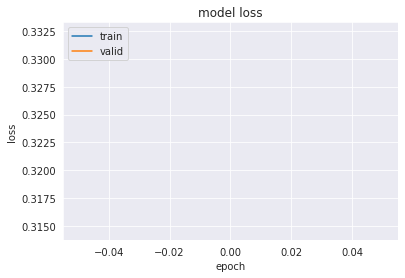

In [24]:
#%autoreload 2
((X_valid_list, y_valid_list), 
 (X_test_list, y_test_list),
 history_list, 

 #scores_valid_list,
 #scores_test_list, 

 #function_values_valid_list, 
 #function_values_test_list, 

 #polynomial_dict_valid_list,
 #polynomial_dict_test_list,

 #distrib_dict_valid_list,
 #distrib_dict_test_list,

 model_list) = interpretation_net_training(lambda_net_train_dataset_list, 
                                           lambda_net_valid_dataset_list, 
                                           lambda_net_test_dataset_list)



In [25]:
#polynomial_dict_valid_list = []
polynomial_dict_test_list = []  


for lambda_net_valid_dataset, lambda_net_test_dataset in zip(lambda_net_valid_dataset_list, lambda_net_test_dataset_list):

    #polynomial_dict_valid = {'lstsq_lambda_pred_polynomials': lambda_net_valid_dataset.lstsq_lambda_pred_polynomial_list,
    #                        'lstsq_target_polynomials': lambda_net_valid_dataset.lstsq_target_polynomial_list,
    #                        'target_polynomials': lambda_net_valid_dataset.target_polynomial_list}    

    polynomial_dict_test = {'lstsq_lambda_pred_polynomials': lambda_net_test_dataset.lstsq_lambda_pred_polynomial_list,
                            'lstsq_target_polynomials': lambda_net_test_dataset.lstsq_target_polynomial_list,
                            'target_polynomials': lambda_net_test_dataset.target_polynomial_list}    

    #polynomial_dict_valid_list.append(polynomial_dict_valid)  
    polynomial_dict_test_list.append(polynomial_dict_test)


In [26]:
print('---------------------------------------------------------------------------------------------------------------------------')
print('------------------------------------------------------- PREDICT INET ------------------------------------------------------')

start = time.time() 

for i, (X_test, model) in enumerate(zip(X_test_list, model_list)):
    #y_test_pred = model.predict(X_test)    
    #print(model.summary())
    #print(X_test.shape)
    y_test_pred = make_inet_prediction(model, X_test, network_data=None, lambda_trained_normalized=False, inet_training_normalized=normalize_inet_data, normalization_parameter_dict=None)
    #print(y_test_pred.shape)   
    polynomial_dict_test_list[i]['inet_polynomials'] = y_test_pred


end = time.time()     
inet_train_time = (end - start) 
minutes, seconds = divmod(int(inet_train_time), 60)
hours, minutes = divmod(minutes, 60)        
print('Predict Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
print('---------------------------------------------------------------------------------------------------------------------------')

---------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------- PREDICT INET ------------------------------------------------------
Predict Time: 0:00:00
---------------------------------------------------------------------------------------------------------------------------


In [27]:
if symbolic_metamodeling_poly_evaluation:
    print('-------------------------------------------------- CALCULATE METAMODEL POLY -----------------------------------------------')

    start = time.time() 

    for i, lambda_net_test_dataset in enumerate(lambda_net_test_dataset_list): 
        
        metamodel_functions_test = symbolic_metamodeling_function_generation(lambda_net_test_dataset, return_expression='approx', function_metamodeling=False, force_polynomial=True)
        polynomial_dict_test_list[i]['metamodel_poly'] = metamodel_functions_test       

    end = time.time()     
    inet_train_time = (end - start) 
    minutes, seconds = divmod(int(inet_train_time), 60)
    hours, minutes = divmod(minutes, 60)        
    print('Metamodel Poly Optimization Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
    print('---------------------------------------------------------------------------------------------------------------------------') 

In [28]:
if symbolic_metamodeling_evaluation:
    print('---------------------------------------------------- CALCULATE METAMODEL --------------------------------------------------')

    start = time.time() 

    for i, lambda_net_test_dataset in enumerate(lambda_net_test_dataset_list): 
        metamodel_functions_test = symbolic_metamodeling_function_generation(lambda_net_test_dataset, return_expression='approx', function_metamodeling=False, force_polynomial=False)
        polynomial_dict_test_list[i]['metamodel_functions'] = metamodel_functions_test       

    end = time.time()     
    inet_train_time = (end - start) 
    minutes, seconds = divmod(int(inet_train_time), 60)
    hours, minutes = divmod(minutes, 60)        
    print('Metamodel Optimization Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
    print('---------------------------------------------------------------------------------------------------------------------------') 

---------------------------------------------------- CALCULATE METAMODEL --------------------------------------------------


[Parallel(n_jobs=-3)]: Using backend LokyBackend with 22 concurrent workers.
[Parallel(n_jobs=-3)]: Done   1 tasks      | elapsed: 40.6min
[Parallel(n_jobs=-3)]: Done   2 tasks      | elapsed: 41.4min
[Parallel(n_jobs=-3)]: Done   3 tasks      | elapsed: 41.4min
[Parallel(n_jobs=-3)]: Done   4 tasks      | elapsed: 41.6min
[Parallel(n_jobs=-3)]: Done   5 tasks      | elapsed: 41.7min
[Parallel(n_jobs=-3)]: Done   6 tasks      | elapsed: 42.0min
[Parallel(n_jobs=-3)]: Done   7 tasks      | elapsed: 45.3min
[Parallel(n_jobs=-3)]: Done   8 tasks      | elapsed: 45.5min
[Parallel(n_jobs=-3)]: Done   9 tasks      | elapsed: 47.1min
[Parallel(n_jobs=-3)]: Done  10 tasks      | elapsed: 47.5min
[Parallel(n_jobs=-3)]: Done  11 tasks      | elapsed: 47.7min
[Parallel(n_jobs=-3)]: Done  12 tasks      | elapsed: 47.7min
[Parallel(n_jobs=-3)]: Done  13 tasks      | elapsed: 48.2min
[Parallel(n_jobs=-3)]: Done  14 tasks      | elapsed: 48.7min
[Parallel(n_jobs=-3)]: Done  15 tasks      | elapsed: 5

[1/(0.981302216546023*exp(-0.00425479230132363*X0**3*X1**3 + 0.00831472447347224*X0**3*X10**3 - 0.0196982985299963*X0**3*X11**3 - 0.00472379108147822*X0**3*X12**3 - 0.00254582680055181*X0**3*X13**3 + 0.00449029998178573*X0**3*X14**3 - 0.000967112472117474*X0**3*X2**3 - 0.00860237304332043*X0**3*X3**3 + 0.00111143630114657*X0**3*X4**3 - 0.00139902040248433*X0**3*X5**3 - 0.00172988741707836*X0**3*X6**3 - 0.00281436812316529*X0**3*X7**3 - 0.00665504294462212*X0**3*X8**3 - 0.00319058371369759*X0**3*X9**3 + 0.0250589284895595*X0**3 + 0.00178023835390808*X0**2*X1**2 - 0.00464539572574527*X0**2*X10**2 + 0.00576909997943487*X0**2*X11**2 + 0.00271063128409909*X0**2*X12**2 + 0.00139863281879962*X0**2*X13**2 - 0.00216874056448649*X0**2*X14**2 + 0.000296424318275732*X0**2*X2**2 + 0.00433163137268296*X0**2*X3**2 - 0.000243353431347068*X0**2*X4**2 + 0.000568996461103781*X0**2*X5**2 + 0.00081555447528712*X0**2*X6**2 + 0.00121852736433281*X0**2*X7**2 + 0.00412287074982231*X0**2*X8**2 + 0.0017635760362

In [29]:
if symbolic_metamodeling_function_evaluation:
    print('----------------------------------------------- CALCULATE METAMODEL FUNCTION ----------------------------------------------')

    start = time.time() 

    for i, lambda_net_test_dataset in enumerate(lambda_net_test_dataset_list): 
        metamodel_functions_test = symbolic_metamodeling_function_generation(lambda_net_test_dataset, return_expression='approx', function_metamodeling=True)
        polynomial_dict_test_list[i]['metamodel_functions_no_GD'] = metamodel_functions_test       

    end = time.time()     
    inet_train_time = (end - start) 
    minutes, seconds = divmod(int(inet_train_time), 60)
    hours, minutes = divmod(minutes, 60)        
    print('Metamodel Function Optimization Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
    print('---------------------------------------------------------------------------------------------------------------------------') 

In [30]:
if symbolic_regression_evaluation:
    print('----------------------------------------- CALCULATE SYMBOLIC REGRESSION FUNCTION ------------------------------------------')

    start = time.time() 

    for i, lambda_net_test_dataset in enumerate(lambda_net_test_dataset_list): 
        symbolic_regression_functions_test = symbolic_regression_function_generation(lambda_net_test_dataset)
        polynomial_dict_test_list[i]['symbolic_regression_functions'] = symbolic_regression_functions_test       

    end = time.time()     
    inet_train_time = (end - start) 
    minutes, seconds = divmod(int(inet_train_time), 60)
    hours, minutes = divmod(minutes, 60)        
    print('Symbolic Regression Optimization Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
    print('---------------------------------------------------------------------------------------------------------------------------')    

In [31]:
#%autoreload 2
if per_network_evaluation:
    print('------------------------------------------------ CALCULATE PER NETWORK POLY -----------------------------------------------')

    start = time.time() 

    for i, lambda_net_test_dataset in enumerate(lambda_net_test_dataset_list): 
        per_network_poly_test = per_network_poly_generation(lambda_net_test_dataset, optimization_type='scipy')
        polynomial_dict_test_list[i]['per_network_polynomials'] = per_network_poly_test       

    end = time.time()     
    inet_train_time = (end - start) 
    minutes, seconds = divmod(int(inet_train_time), 60)
    hours, minutes = divmod(minutes, 60)        
    print('Per Network Optimization Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
    print('---------------------------------------------------------------------------------------------------------------------------')

In [32]:
print('------------------------------------------------ CALCULATE FUNCTION VALUES ------------------------------------------------')                

start = time.time() 

function_values_test_list = []
for lambda_net_test_dataset, polynomial_dict_test in zip(lambda_net_test_dataset_list, polynomial_dict_test_list):
    function_values_test = calculate_all_function_values(lambda_net_test_dataset, polynomial_dict_test)
    function_values_test_list.append(function_values_test)

end = time.time()     
inet_train_time = (end - start) 
minutes, seconds = divmod(int(inet_train_time), 60)
hours, minutes = divmod(minutes, 60)        
print('FV Calculation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
print('---------------------------------------------------------------------------------------------------------------------------')

------------------------------------------------ CALCULATE FUNCTION VALUES ------------------------------------------------
True


[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.


True


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    1.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.


True


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.


False


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=10)]: Using backend SequentialBackend with 1 concurrent workers.


metamodel_poly
Exit <class 'KeyError'>
metamodel_functions
metamodel_functions_no_GD
Exit <class 'KeyError'>
symbolic_regression_functions
Exit <class 'KeyError'>
per_network_polynomials
Exit <class 'KeyError'>
FV Calculation Time: 0:06:20
---------------------------------------------------------------------------------------------------------------------------


[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:  6.0min finished


In [33]:
print('----------------------------------------------------- CALCULATE SCORES ----------------------------------------------------')                

start = time.time() 

scores_test_list = []
distrib_dict_test_list = []

for function_values_test, polynomial_dict_test in zip(function_values_test_list, polynomial_dict_test_list):
    scores_test, distrib_test = evaluate_all_predictions(function_values_test, polynomial_dict_test)
    scores_test_list.append(scores_test)
    distrib_dict_test_list.append(distrib_test)

end = time.time()     
inet_train_time = (end - start) 
minutes, seconds = divmod(int(inet_train_time), 60)
hours, minutes = divmod(minutes, 60)        
print('Score Calculation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')     
print('---------------------------------------------------------------------------------------------------------------------------')
print('---------------------------------------------------------------------------------------------------------------------------')         


----------------------------------------------------- CALCULATE SCORES ----------------------------------------------------
lambda_preds_VS_target_polynomials
lambda_preds_VS_lstsq_lambda_pred_polynomials
lambda_preds_VS_lstsq_target_polynomials
lambda_preds_VS_inet_polynomials
lambda_preds_VS_metamodel_functions
target_polynomials_VS_lstsq_lambda_pred_polynomials
target_polynomials_VS_lstsq_target_polynomials
target_polynomials_VS_inet_polynomials
target_polynomials_VS_metamodel_functions
lstsq_lambda_pred_polynomials_VS_lstsq_target_polynomials
lstsq_lambda_pred_polynomials_VS_inet_polynomials
lstsq_lambda_pred_polynomials_VS_metamodel_functions
lstsq_target_polynomials_VS_inet_polynomials
lstsq_target_polynomials_VS_metamodel_functions
inet_polynomials_VS_metamodel_functions
Score Calculation Time: 0:00:02
---------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------

In [34]:
identifier_type = 'epochs' if samples_list == None else 'samples'
save_results(scores_test_list, by=identifier_type)

## Evaluate Interpretation Net

In [35]:
if nas:
    for trial in history_list[-1]: 
        print(trial.summary())

In [36]:
if len(model_list) >= 1:
    print(model_list[-1].summary())
    print(model_list[-1].get_config())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 1276)]       0                                            
__________________________________________________________________________________________________
hidden1_512 (Dense)             (None, 512)          653824      input[0][0]                      
__________________________________________________________________________________________________
activation1_relu (Activation)   (None, 512)          0           hidden1_512[0][0]                
__________________________________________________________________________________________________
dropout1_0.25 (Dropout)         (None, 512)          0           activation1_relu[0][0]           
______________________________________________________________________________________________

In [37]:
if evaluate_with_real_function:
    keys = ['inetPoly_VS_targetPoly_test', 'perNetworkPoly_VS_targetPoly_test', 'predLambda_VS_targetPoly_test', 'lstsqLambda_VS_targetPoly_test', 'lstsqTarget_VS_targetPoly_test']
else:
    keys = ['inetPoly_VS_predLambda_test', 'inetPoly_VS_lstsqLambda_test', 'perNetworkPoly_VS_predLambda_test', 'perNetworkPoly_VS_lstsqLambda_test', 'lstsqLambda_VS_predLambda_test', 'predLambda_VS_targetPoly_test']

In [38]:
scores_test_list[-1]

,MAE,RMSE,MAPE,Accuracy,Accuracy Multilabel,MAE FV,RMSE FV,MAPE FV,R2 FV,RAAE FV,RMAE FV,MEAN STD FV DIFF,MEAN FV1,MEAN FV2,STD FV1,STD FV2
lambda_preds_VS_target_polynomials,NaN,NaN,NaN,NaN,NaN,0.045,0.059,0.960,0.974,0.120,0.749,0.059,-0.023,-0.023,0.570,0.577
lambda_preds_VS_lstsq_lambda_pred_polynomials,NaN,NaN,NaN,NaN,NaN,0.063,0.082,1.316,0.952,0.166,0.901,0.081,-0.023,-0.024,0.570,0.577
lambda_preds_VS_lstsq_target_polynomials,NaN,NaN,NaN,NaN,NaN,0.045,0.059,0.960,0.974,0.120,0.749,0.059,-0.023,-0.023,0.570,0.577
lambda_preds_VS_inet_polynomials,NaN,NaN,NaN,NaN,NaN,0.435,0.532,2.917,-0.991,1.099,2.789,0.396,-0.023,0.100,0.570,0.105
lambda_preds_VS_metamodel_functions,NaN,NaN,NaN,NaN,NaN,0.584,0.645,12.996,-2.326,1.565,0.942,0.294,-0.023,NaN,0.570,NaN
target_polynomials_VS_lstsq_lambda_pred_polynomials,0.081,0.111,7.518,0.404,0.000,0.063,0.082,1.640,0.954,0.162,0.827,0.082,-0.023,-0.024,0.577,0.577
target_polynomials_VS_lstsq_target_polynomials,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,-0.023,-0.023,0.577,0.577
target_polynomials_VS_inet_polynomials,0.081,0.110,7.592,0.379,0.000,0.437,0.540,5.149,-0.948,1.078,3.119,0.406,-0.023,0.100,0.577,0.105
target_polynomials_VS_metamodel_functions,NaN,NaN,NaN,NaN,NaN,0.588,0.650,17.888,-2.194,1.533,1.385,0.304,-0.023,NaN,0.577,NaN
lstsq_lambda_pred_polynomials_VS_lstsq_target_polynomials,0.081,0.111,2.066,0.404,0.000,0.063,0.082,1.260,0.954,0.162,0.877,0.082,-0.024,-0.023,0.577,0.577


In [56]:
distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_metamodel_functions'].values

array([0.40022758, 0.4751976 , 0.40166757, 0.39248136, 0.74831784,
       0.79104924, 0.91268224,        nan, 0.32266104, 0.6532152 ,
       0.726985  , 0.9015154 , 0.3780623 ,        nan, 0.235753  ,
              nan, 0.2774492 , 0.47218463, 0.6519221 , 1.139599  ,
       0.7292871 , 0.36129317, 1.1545926 , 0.51352257, 0.34864414,
       1.2441533 , 0.23803857, 0.5217836 , 0.55924296, 0.90955585,
       0.58548284, 0.49752334, 1.0223942 , 0.36363655, 0.293139  ,
       0.46929282,        nan, 0.38180906, 0.55486375, 0.5797172 ,
       0.44761515, 0.58645517, 0.30756015, 0.37279433, 0.44923934,
       0.8362571 , 0.44120342, 0.7046457 , 0.22158939, 0.99762326,
       0.55593735, 0.5822723 , 0.6204553 , 0.5626214 , 0.78698444,
       0.40813613,        nan, 0.620562  , 0.5182147 , 1.0966816 ,
       0.6199793 , 0.28060514, 0.45596436, 0.6988665 ,        nan,
       0.5231583 , 0.79955274, 0.7103271 , 1.3265043 , 0.38662446,
       0.6646031 , 0.36756986, 0.49691504, 0.5147656 , 0.49988

In [57]:
distrib_dict_test_list[-1]['R2'].loc['lambda_preds_VS_metamodel_functions'].values

array([ -0.43211558,  -2.05106422,  -0.41401815,  -1.50206663,
        -2.09404668,  -5.43292055,  -5.73209208,          nan,
        -1.32412258,  -3.83052332,  -3.0872524 ,  -3.03845148,
        -0.27882905,          nan,   0.29390974,          nan,
         0.3731632 ,  -1.34341554,  -3.01206931,  -5.26110467,
        -7.78840452,  -0.17038947,  -6.12477014,  -0.36399666,
        -0.46627417, -15.88473735,   0.32174835,  -0.73369201,
        -2.24258147,  -2.4243856 ,  -4.06235453,  -1.44131367,
        -4.87380198,  -1.25956086,   0.36580291,  -0.72772258,
                nan,  -0.07863725,  -4.24113688,  -1.74827869,
        -0.47698941,  -3.93700494,  -0.2283257 ,  -0.47504875,
        -1.19472179,  -2.23929899,   0.09611294,  -3.02316564,
         0.38641481,  -4.15752428,  -1.26163304,  -1.74416353,
        -1.43902075,  -1.54989278,  -1.75210397,  -1.50965745,
                nan,  -1.7441824 ,  -1.48323879,  -3.97212554,
        -2.21602228,   0.27685453,  -0.84542602,  -2.04

In [39]:
distrib_dict_test_list[-1]['MAE']

,L-0,L-1,L-2,L-3,L-4,L-5,L-6,L-7,L-8,L-9,L-10,L-11,L-12,L-13,L-14,L-15,L-16,L-17,L-18,L-19,L-20,L-21,L-22,L-23,L-24,L-25,L-26,L-27,L-28,L-29,L-30,L-31,L-32,L-33,L-34,L-35,L-36,L-37,L-38,L-39,L-40,L-41,L-42,L-43,L-44,L-45,L-46,L-47,L-48,L-49,L-50,L-51,L-52,L-53,L-54,L-55,L-56,L-57,L-58,L-59,L-60,L-61,L-62,L-63,L-64,L-65,L-66,L-67,L-68,L-69,L-70,L-71,L-72,L-73,L-74,L-75,L-76,L-77,L-78,L-79,L-80,L-81,L-82,L-83,L-84,L-85,L-86,L-87,L-88,L-89,L-90,L-91,L-92,L-93,L-94,L-95,L-96,L-97,L-98,L-99
lambda_preds_VS_target_polynomials,0.050,0.044,0.046,0.043,0.042,0.056,0.044,0.052,0.044,0.034,0.043,0.052,0.057,0.040,0.042,0.049,0.054,0.045,0.044,0.050,0.044,0.047,0.041,0.049,0.046,0.046,0.045,0.045,0.042,0.055,0.037,0.042,0.040,0.028,0.038,0.049,0.048,0.050,0.041,0.034,0.046,0.039,0.058,0.042,0.043,0.039,0.057,0.054,0.040,0.053,0.054,0.038,0.039,0.038,0.047,0.040,0.042,0.051,0.067,0.055,0.045,0.038,0.052,0.044,0.046,0.062,0.047,0.037,0.043,0.040,0.044,0.049,0.046,0.045,0.044,0.052,0.042,0.044,0.055,0.048,0.041,0.041,0.061,0.036,0.038,0.051,0.045,0.046,0.039,0.044,0.032,0.031,0.048,0.049,0.042,0.048,0.041,0.038,0.049,0.040
lambda_preds_VS_lstsq_lambda_pred_polynomials,0.073,0.057,0.074,0.065,0.056,0.064,0.061,0.072,0.055,0.051,0.056,0.077,0.070,0.059,0.062,0.068,0.075,0.066,0.060,0.066,0.047,0.060,0.050,0.070,0.060,0.063,0.062,0.068,0.064,0.075,0.053,0.056,0.055,0.045,0.058,0.070,0.063,0.068,0.051,0.055,0.065,0.055,0.062,0.061,0.060,0.064,0.081,0.072,0.059,0.079,0.063,0.059,0.057,0.068,0.070,0.057,0.057,0.068,0.078,0.068,0.068,0.060,0.067,0.061,0.075,0.068,0.068,0.055,0.062,0.050,0.068,0.068,0.064,0.061,0.065,0.078,0.062,0.062,0.072,0.071,0.053,0.056,0.086,0.051,0.057,0.075,0.072,0.060,0.061,0.068,0.046,0.042,0.061,0.071,0.053,0.050,0.053,0.058,0.066,0.053
lambda_preds_VS_lstsq_target_polynomials,0.050,0.044,0.046,0.043,0.042,0.056,0.044,0.052,0.044,0.034,0.043,0.052,0.057,0.040,0.042,0.049,0.054,0.045,0.044,0.050,0.044,0.047,0.041,0.049,0.046,0.046,0.045,0.045,0.042,0.055,0.037,0.042,0.040,0.028,0.038,0.049,0.048,0.050,0.041,0.034,0.046,0.039,0.058,0.042,0.043,0.039,0.057,0.054,0.040,0.053,0.054,0.038,0.039,0.038,0.047,0.040,0.042,0.051,0.067,0.055,0.045,0.038,0.052,0.044,0.046,0.062,0.047,0.037,0.043,0.040,0.044,0.049,0.046,0.045,0.044,0.052,0.042,0.044,0.055,0.048,0.041,0.041,0.061,0.036,0.038,0.051,0.045,0.046,0.039,0.044,0.032,0.031,0.048,0.049,0.042,0.048,0.041,0.038,0.049,0.040
lambda_preds_VS_inet_polynomials,0.343,0.240,0.312,0.217,0.540,0.519,0.639,1.166,0.186,0.324,0.495,0.613,0.350,0.689,0.453,0.471,0.339,0.306,0.369,1.025,0.401,0.332,1.001,0.461,0.301,0.989,0.348,0.395,0.315,0.645,0.309,0.303,0.726,0.195,0.531,0.328,0.521,0.396,0.243,0.356,0.327,0.309,0.279,0.308,0.286,0.631,0.459,0.424,0.314,0.859,0.370,0.361,0.397,0.333,0.514,0.223,0.594,0.359,0.298,0.840,0.307,0.416,0.340,0.502,0.896,0.341,0.498,0.290,1.088,0.293,0.452,0.261,0.373,0.266,0.240,0.453,0.530,0.391,0.386,0.302,0.325,0.230,0.607,0.267,0.347,0.344,0.502,0.296,0.279,0.625,0.215,0.321,0.223,0.459,0.247,0.563,0.477,0.270,0.637,0.419
lambda_preds_VS_metamodel_functions,0.400,0.475,0.402,0.392,0.748,0.791,0.913,NaN,0.323,0.653,0.727,0.902,0.378,NaN,0.236,NaN,0.277,0.472,0.652,1.140,0.729,0.361,1.155,0.514,0.349,1.244,0.238,0.522,0.559,0.910,0.585,0.498,1.022,0.364,0.293,0.469,NaN,0.382,0.555,0.580,0.448,0.586,0.308,0.373,0.449,0.836,0.441,0.705,0.222,0.998,0.556,0.582,0.620,0.563,0.787,0.408,NaN,0.621,0.518,1.097,0.620,0.281,0.456,0.699,NaN,0.523,0.800,0.710,1.327,0.387,0.665,0.368,0.497,0.515,0.500,0.743,0.856,0.624,0.575,0.466,0.433,0.400,0.389,0.373,0.663,0.383,0.680,0.369,0.439,NaN,0.512,0.287,0.520,0.656,0.581,0.804,0.822,0.455,0.931,0.695
target_polynomials_VS_lstsq_lambda_pred_polynomials,0.072,0.057,0.069,0.060,0.057,0.068,0.059,0.069,0.059,0.050,0.060,0.074,0.074,0.058,0.064,0.069,0.070,0.065,0.059,0.067,0.050,0.062,0.053,0.067,0.064,0.062,0.060,0.067,0.061,0.072,0.051,0.060,0.057,0.043,0.057,0.072,0.063,0.068,0.056,0.050,0.060,0.057,0.069,0.064,0.059,0.060,0.07

In [40]:
distrib_dict_test_list[-1]['R2']

,L-0,L-1,L-2,L-3,L-4,L-5,L-6,L-7,L-8,L-9,L-10,L-11,L-12,L-13,L-14,L-15,L-16,L-17,L-18,L-19,L-20,L-21,L-22,L-23,L-24,L-25,L-26,L-27,L-28,L-29,L-30,L-31,L-32,L-33,L-34,L-35,L-36,L-37,L-38,L-39,L-40,L-41,L-42,L-43,L-44,L-45,L-46,L-47,L-48,L-49,L-50,L-51,L-52,L-53,L-54,L-55,L-56,L-57,L-58,L-59,L-60,L-61,L-62,L-63,L-64,L-65,L-66,L-67,L-68,L-69,L-70,L-71,L-72,L-73,L-74,L-75,L-76,L-77,L-78,L-79,L-80,L-81,L-82,L-83,L-84,L-85,L-86,L-87,L-88,L-89,L-90,L-91,L-92,L-93,L-94,L-95,L-96,L-97,L-98,L-99
lambda_preds_VS_target_polynomials,0.973,0.964,0.977,0.956,0.986,0.947,0.976,0.989,0.939,0.981,0.980,0.980,0.966,0.989,0.974,0.957,0.974,0.971,0.971,0.981,0.949,0.975,0.986,0.984,0.966,0.961,0.976,0.982,0.974,0.981,0.968,0.975,0.986,0.980,0.988,0.976,0.982,0.979,0.956,0.987,0.980,0.965,0.944,0.976,0.971,0.990,0.982,0.966,0.978,0.978,0.970,0.984,0.986,0.983,0.987,0.967,0.988,0.973,0.944,0.981,0.977,0.984,0.970,0.983,0.992,0.953,0.974,0.974,0.985,0.975,0.985,0.962,0.979,0.965,0.962,0.977,0.980,0.984,0.965,0.972,0.981,0.969,0.984,0.975,0.983,0.974,0.987,0.970,0.968,0.989,0.975,0.979,0.943,0.978,0.951,0.949,0.955,0.970,0.978,0.981
lambda_preds_VS_lstsq_lambda_pred_polynomials,0.944,0.939,0.943,0.908,0.976,0.935,0.955,0.979,0.911,0.955,0.965,0.957,0.947,0.976,0.944,0.919,0.951,0.941,0.952,0.968,0.942,0.961,0.980,0.969,0.943,0.930,0.952,0.964,0.941,0.968,0.939,0.958,0.975,0.953,0.973,0.954,0.969,0.964,0.932,0.967,0.959,0.936,0.941,0.949,0.948,0.974,0.965,0.939,0.954,0.951,0.961,0.962,0.973,0.950,0.972,0.931,0.977,0.954,0.927,0.972,0.947,0.961,0.950,0.970,0.979,0.946,0.947,0.943,0.968,0.964,0.964,0.926,0.960,0.934,0.916,0.951,0.958,0.968,0.942,0.938,0.969,0.942,0.968,0.953,0.966,0.942,0.968,0.948,0.926,0.974,0.950,0.962,0.916,0.954,0.927,0.947,0.924,0.929,0.960,0.967
lambda_preds_VS_lstsq_target_polynomials,0.973,0.964,0.977,0.956,0.986,0.947,0.976,0.989,0.939,0.981,0.980,0.980,0.966,0.989,0.974,0.957,0.974,0.971,0.971,0.981,0.949,0.975,0.986,0.984,0.966,0.961,0.976,0.982,0.974,0.981,0.968,0.975,0.986,0.980,0.988,0.976,0.982,0.979,0.956,0.987,0.980,0.965,0.944,0.976,0.971,0.990,0.982,0.966,0.978,0.978,0.970,0.984,0.986,0.983,0.987,0.967,0.988,0.973,0.944,0.981,0.977,0.984,0.970,0.983,0.992,0.953,0.974,0.974,0.985,0.975,0.985,0.962,0.979,0.965,0.962,0.977,0.980,0.984,0.965,0.972,0.981,0.969,0.984,0.975,0.983,0.974,0.987,0.970,0.968,0.989,0.975,0.979,0.943,0.978,0.951,0.949,0.955,0.970,0.978,0.981
lambda_preds_VS_inet_polynomials,-0.169,0.002,0.019,0.045,-0.977,-2.500,-2.970,-3.200,0.023,-0.657,-1.356,-1.426,-0.228,-1.904,-1.598,-1.905,0.014,-0.235,-0.745,-4.778,-2.572,-0.088,-4.997,-0.240,-0.481,-10.087,-0.545,-0.161,-0.371,-1.263,-1.018,-0.086,-2.664,0.120,-1.189,0.029,-0.898,-0.160,-0.429,-0.336,-0.013,-0.829,-0.192,-0.223,-0.076,-1.090,-0.132,-0.959,-0.247,-3.523,-0.195,-0.344,-0.309,-0.143,-0.539,-0.015,-1.175,-0.174,-0.014,-2.537,-0.099,-0.824,-0.195,-1.124,-1.613,-0.267,-1.540,-0.439,-5.965,-0.218,-0.384,-0.033,-0.272,-0.205,-0.046,-0.647,-1.822,-0.169,-0.611,-0.042,-0.117,0.065,-0.494,-0.215,-0.337,-0.151,-0.384,-0.224,-0.474,-0.950,-0.064,-1.220,-0.154,-0.858,-0.442,-4.506,-3.592,-0.500,-2.120,-1.178
lambda_preds_VS_metamodel_functions,-0.432,-2.051,-0.414,-1.502,-2.094,-5.433,-5.732,NaN,-1.324,-3.831,-3.087,-3.038,-0.279,NaN,0.294,NaN,0.373,-1.343,-3.012,-5.261,-7.788,-0.170,-6.125,-0.364,-0.466,-15.885,0.322,-0.734,-2.243,-2.424,-4.062,-1.441,-4.874,-1.260,0.366,-0.728,NaN,-0.079,-4.241,-1.748,-0.477,-3.937,-0.228,-0.475,-1.195,-2.239,0.096,-3.023,0.386,-4.158,-1.262,-1.744,-1.439,-1.550,-1.752,-1.510,NaN,-1.744,-1.483,-3.972,-2.216,0.277,-0.845,-2.043,NaN,-1.387,-3.871,-5.168,-8.255,-0.737,-1.516,-0.694,-0.918,-2.347,-2.427,-2.265,-4.346,-1.377,-1.737,-1.011,-0.663,-1.233,0.394,-0.969,-2.382,-0.217,-1.200,-0.476,-1.809,NaN,-3.347,-0.379,-3.341,-1.837,-4.775,-7.985,-10.161,-2.018,-4.243,-3.022
target_polynomials_VS_lstsq_lambda_pred_polynomials,0.945,0.945,0.948,0.926,0.975,0.933,0.958,0.981,0.909,0.959,0.960,0.962,0.942,0.977,0.944,0.925,0.95

In [41]:
index_min = int(np.argmin(distrib_dict_test_list[-1]['R2'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials']))

print(distrib_dict_test_list[-1]['R2'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials'][index_min])

polynomial_lambda = lambda_net_test_dataset.lstsq_lambda_pred_polynomial_list[index_min]
print_polynomial_from_coefficients(polynomial_lambda, force_complete_poly_representation=True)

0.9076832423856293


-0.0012367233397044*a**3 + 0.0034413083038054*a**2*b - 0.0308378356762461*a**2*c + 0.127740229276436*a**2*d - 0.121749934144479*a**2*e + 0.0206430620843828*a**2*f - 0.0260298091863699*a**2*g + 0.0078853176452954*a**2*h + 0.0474109855214371*a**2*i - 0.200987253829527*a**2*j + 0.0704760377039829*a**2*k + 0.067015946274554*a**2*l - 0.01107515469206*a**2*m + 0.0050272980973706*a**2*n - 0.0893171126069843*a**2*o + 0.102433691755727*a**2 + 0.0355792858408284*a*b**2 - 0.133557458559065*a*b*c + 0.0153461571982225*a*b*d - 0.0129905044564665*a*b*e - 0.0577725575833722*a*b*f - 0.0866047865579505*a*b*g - 0.067553012042797*a*b*h - 0.111034932306694*a*b*i + 0.352467141832569*a*b*j - 0.0667373488657655*a*b*k + 0.150259555424323*a*b*l + 0.111708767673101*a*b*m + 0.108204828730387*a*b*n - 0.268762987450969*a*b*o + 0.0296773306448416*a*b + 0.0926735903680509*a*c**2 - 0.0253938268874515*a*c*d + 0.0314401783454244*a*c*e + 0.0199022198104875*a*c*f + 0.143038746597928*a*c*g + 0.0512764196314343*a*c*h + 0.06

In [42]:
r2_values_inet = distrib_dict_test_list[-1]['R2'].loc['lambda_preds_VS_inet_polynomials']
print('Mean: ' + str(np.mean(r2_values_inet)) + ' (' + str(r2_values_inet.shape[0]) + ' Samples)')

r2_values_positive_inet = r2_values_inet[r2_values_inet>0]
print('Mean (only positive): ' + str(np.mean(r2_values_positive_inet)) + ' (' + str(r2_values_positive_inet.shape[0]) + ' Samples)')



Mean: -0.9913829259832063 (100 Samples)
Mean (only positive): 0.039565834390412946 (8 Samples)


In [43]:
r2_values_lstsq_lambda = distrib_dict_test_list[-1]['R2'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials']
print('Mean: ' + str(np.mean(r2_values_lstsq_lambda)) + ' (' + str(r2_values_inet.shape[0]) + ' Samples)')

r2_values_positive_lstsq_lambda = r2_values_lstsq_lambda[r2_values_lstsq_lambda>0]
print('Mean (only positive): ' + str(np.mean(r2_values_positive_lstsq_lambda)) + ' (' + str(r2_values_positive_lstsq_lambda.shape[0]) + ' Samples)')



Mean: 0.952148420210434 (100 Samples)
Mean (only positive): 0.952148420210434 (100 Samples)


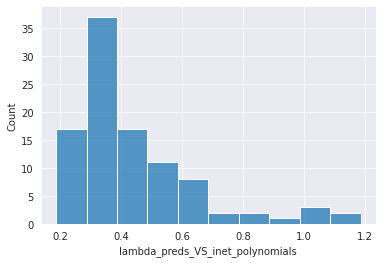

In [44]:
p = sns.histplot(distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_inet_polynomials'][distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_inet_polynomials'] < 50], binwidth=0.1)
#p.set(xlim=(0, 20))


[(0.0, 1.0)]

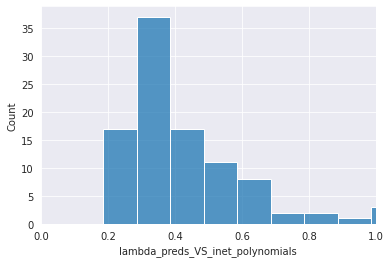

In [45]:
p = sns.histplot(distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_inet_polynomials'][distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_inet_polynomials'] < 50], binwidth=0.1)
p.set(xlim=(0, 1))


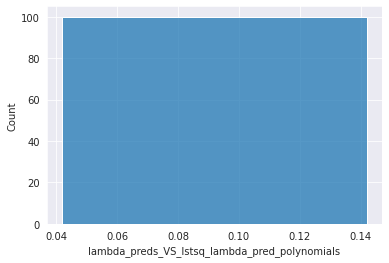

In [46]:
p = sns.histplot(distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials'][distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials'] < 50], binwidth=0.1)
#p.set(xlim=(0, 20))


[(0.0, 1.0)]

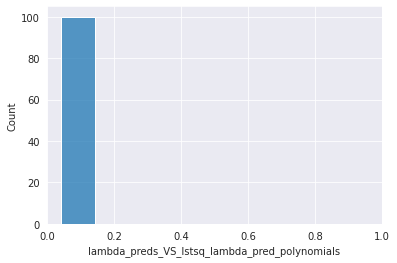

In [47]:
p = sns.histplot(distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials'][distrib_dict_test_list[-1]['MAE'].loc['lambda_preds_VS_lstsq_lambda_pred_polynomials'] < 50], binwidth=0.1)
p.set(xlim=(0, 1))


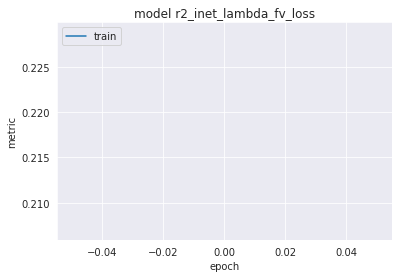

In [48]:
if not nas:
    history = history_list[-1]

    plt.plot(history[list(history.keys())[1]])
    if consider_labels_training or evaluate_with_real_function:
        plt.plot(history[list(history.keys())[len(history.keys())//2+1]]) 
    plt.title('model ' + list(history.keys())[1])
    plt.ylabel('metric')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    plt.savefig('./data/results/' + path_identifier_interpretation_net_data + '/metric_' + '_epoch_' + str(epochs_lambda).zfill(3) + '.png')


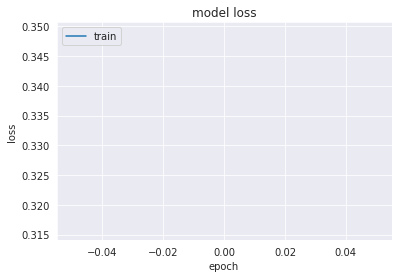

In [49]:
if not nas:
    history = history_list[-1]

    plt.plot(history['loss'])
    if consider_labels_training or evaluate_with_real_function:
        plt.plot(history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    plt.savefig('./data/results/' + path_identifier_interpretation_net_data + '/loss_' + '_epoch_' + str(epochs_lambda).zfill(3) + '.png')    


### Multi Epoch/Sampes Analysis

### Generate Comparison Plots

In [50]:
if len(scores_test_list) > 1:
    plot_metric_list = ['MAE FV', 'RMSE FV', 'MAPE FV', 'R2 FV', 'RAAE FV', 'RMAE FV']

    generate_inet_comparison_plot(scores_test_list, plot_metric_list)

In [51]:
if len(scores_test_list) > 1:
    plot_metric_list = ['MAE FV']

    generate_inet_comparison_plot(scores_test_list, plot_metric_list)

In [52]:
if len(scores_test_list) > 1:
    plot_metric_list = ['R2 FV']

    generate_inet_comparison_plot(scores_test_list, plot_metric_list, ylim=(-5, 1))

#### Generate and Analyze Predictions for Random Function

In [53]:
index = 6

custom_representation_keys_fixed = ['target_polynomials', 'lstsq_target_polynomials', 'lstsq_lambda_pred_polynomials', 'lstsq_lambda_pred_polynomials']
custom_representation_keys_dynamic = ['inet_polynomials', 'per_network_polynomials']
sympy_representation_keys = ['metamodel_functions']


print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')

for key in polynomial_dict_test_list[-1].keys():
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print(key)
    if key in custom_representation_keys_fixed:
        print_polynomial_from_coefficients(polynomial_dict_test_list[-1][key][index], force_complete_poly_representation=True, round_digits=4)
        print(polynomial_dict_test_list[-1][key][index])
    elif key in custom_representation_keys_dynamic:
        print_polynomial_from_coefficients(polynomial_dict_test_list[-1][key][index], round_digits=4)
        print(polynomial_dict_test_list[-1][key][index])
    else:
        display(polynomial_dict_test_list[-1][key][index])

print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')


------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
lstsq_lambda_pred_polynomials


0.1641*a**3 - 0.1247*a**2*b - 0.1932*a**2*c + 0.0546*a**2*d - 0.0551*a**2*e + 0.1053*a**2*f - 0.1131*a**2*g - 0.066*a**2*h - 0.0442*a**2*i + 0.2569*a**2*j + 0.0829*a**2*k - 0.0544*a**2*l + 0.122*a**2*m - 0.1183*a**2*n - 0.0997*a**2*o - 0.0739*a**2 - 0.0648*a*b**2 + 0.0976*a*b*c + 0.038*a*b*d - 0.1999*a*b*e + 0.1207*a*b*f - 0.0239*a*b*g - 0.0114*a*b*h + 0.0133*a*b*i + 0.0363*a*b*j - 0.0196*a*b*k + 0.0983*a*b*l - 0.0674*a*b*m + 0.1101*a*b*n + 0.0292*a*b*o + 0.0664*a*b + 0.0627*a*c**2 - 0.0896*a*c*d + 0.2229*a*c*e + 0.032*a*c*f + 0.042*a*c*g + 0.1792*a*c*h - 0.0921*a*c*i + 0.1179*a*c*j - 0.0406*a*c*k - 0.0403*a*c*l + 0.0527*a*c*m + 0.0936*a*c*n - 0.0627*a*c*o - 0.1692*a*c - 0.0158*a*d**2 - 0.0355*a*d*e - 0.0011*a*d*f - 0.0406*a*d*g - 0.0005*a*d*h + 0.0811*a*d*i + 0.0721*a*d*j - 0.2694*a*d*k + 0.0011*a*d*l + 0.1165*a*d*m + 0.2082*a*d*n - 0.0287*a*d*o - 0.199*a*d + 0.1035*a*e**2 - 0.0418*a*e*f + 0.0014*a*e*g - 0.0976*a*e*h + 0.1315*a*e*i - 0.0516*a*e*j + 0.0799*a*e*k + 0.0208*a*e*l - 0.1017

[ 1.64077444e-01 -1.24735302e-01 -1.93210624e-01  5.46466563e-02
 -5.51065524e-02  1.05261625e-01 -1.13097137e-01 -6.59517183e-02
 -4.41799235e-02  2.56946827e-01  8.29079697e-02 -5.43526346e-02
  1.21975048e-01 -1.18289080e-01 -9.97487368e-02 -7.38585604e-02
 -6.47825777e-02  9.75770760e-02  3.80309896e-02 -1.99857292e-01
  1.20687251e-01 -2.39466139e-02 -1.14433662e-02  1.33483284e-02
  3.62982022e-02 -1.96128532e-02  9.82905139e-02 -6.73569126e-02
  1.10111025e-01  2.92473985e-02  6.63793467e-02  6.26560867e-02
 -8.96004586e-02  2.22858173e-01  3.20048844e-02  4.19517227e-02
  1.79219947e-01 -9.21346914e-02  1.17851197e-01 -4.05528724e-02
 -4.02885846e-02  5.26665500e-02  9.36194349e-02 -6.26827030e-02
 -1.69227176e-01 -1.57559480e-02 -3.54808547e-02 -1.06477573e-03
 -4.05999503e-02 -4.78660639e-04  8.10961472e-02  7.21282214e-02
 -2.69449934e-01  1.09183491e-03  1.16490268e-01  2.08209742e-01
 -2.87439948e-02 -1.99009158e-01  1.03534041e-01 -4.18280118e-02
  1.40023561e-03 -9.76189

-0.0945*a*c - 0.4056*a*d*h + 0.466*a*j*k - 0.5648*a*k + 0.6809*b*e*o + 0.4266*b*f*h + 0.7432*b*k**2 - 0.3057*c*j*k - 0.1581*d*h*j - 0.4009*e*f + 0.158*f*g*l - 0.9286*f*i*m - 0.6468*f*j**2 - 0.6082*g*h - 0.6076*g*n

[-1.61756006e-08 -1.50308032e-08 -1.76242826e-08 -6.57836816e-08
  7.51912299e-09 -2.22325358e-08  4.06218540e-08 -3.91424590e-08
  1.18907240e-08 -4.25911941e-08 -1.28268147e-08  3.96405563e-08
 -6.87546863e-08 -4.77309258e-08  1.42158604e-08  1.41095998e-07
 -9.79513814e-08  6.55902376e-08 -5.61816900e-08 -3.12646464e-08
  2.79799062e-08 -5.22605748e-08  2.79442128e-08  4.09608829e-09
  2.49575282e-08 -3.27936969e-10 -2.16951816e-08  6.67336053e-08
  7.80054213e-08  4.00173117e-08  3.22991902e-08 -2.95279085e-08
  5.24889301e-09 -2.90317546e-08 -1.06097506e-08  5.06602327e-08
 -1.15375682e-07 -5.81598189e-08 -4.60300671e-08 -1.43396067e-08
  3.09914220e-08 -4.50442263e-08  7.37223158e-08  7.26769411e-09
 -9.45151293e-02  6.43729439e-08  5.20066492e-08 -2.23998425e-08
 -1.86305998e-08 -4.05554551e-01 -2.43690940e-08 -5.80739352e-08
 -5.01216586e-09  3.57314199e-08  8.14671300e-09 -2.67330114e-08
 -2.78676117e-08  9.36981911e-08 -4.50967422e-08 -3.25140769e-08
 -1.33953761e-08 -1.98248

-0.0945*a*c - 0.4056*a*d*h + 0.466*a*j*k - 0.5648*a*k + 0.6809*b*e*o + 0.4266*b*f*h + 0.7432*b*k**2 - 0.3057*c*j*k - 0.1581*d*h*j - 0.4009*e*f + 0.158*f*g*l - 0.9286*f*i*m - 0.6468*f*j**2 - 0.6082*g*h - 0.6076*g*n

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.09451519  0.          0.          0.
  0.         -0.40555447  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         

-0.00779999978840351*a*b*d + 0.0625*a*b*l + 0.067500002682209*b*g*o + 0.123199999332428*d*f*o - 0.00039999998989515*d*h*k + 0.0390999987721443*e**2*o - 0.0384000018239021*e*g*k - 0.0438000001013279*e*i*k - 0.171000003814697*f*h*i + 0.133900001645088*f*k - 0.0478999987244606*g*j*o + 0.0640999972820282*h*i**2 + 0.0315999984741211*h*l*n - 0.0502999983727932*i**2*n + 0.112199999392033*l*n

[ 0.03908952  0.11215898 -0.17097074 ...  0.00124099  0.0012549
  0.00116369]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
metamodel_functions


1/(0.862732378821606*exp(-0.00678944175769731*X0**3*X1**3 - 0.0275143979356721*X0**3*X10**3 - 0.0012270794780868*X0**3*X11**3 - 0.00146667620939431*X0**3*X12**3 - 0.000943641077988693*X0**3*X13**3 - 0.00466488603041589*X0**3*X14**3 - 0.00744773244859262*X0**3*X2**3 - 0.01564351042044*X0**3*X3**3 - 0.00617871266319645*X0**3*X4**3 + 0.00181840220866338*X0**3*X5**3 - 0.00565886770579241*X0**3*X6**3 - 0.0119317146177835*X0**3*X7**3 - 0.00249692093416174*X0**3*X8**3 + 0.0214463210624106*X0**3*X9**3 + 3.27336987723741e-16*X0**3 + 0.00300637919250184*X0**2*X1**2 + 0.00746544059354739*X0**2*X10**2 + 0.000454702472496111*X0**2*X11**2 + 0.000340167382523181*X0**2*X12**2 + 0.000100991709563295*X0**2*X13**2 + 0.00173057445907476*X0**2*X14**2 + 0.00129948975702043*X0**2*X2**2 + 0.00432773609014192*X0**2*X3**2 + 0.00154806746674136*X0**2*X4**2 - 7.94641785010683e-5*X0**2*X5**2 - 0.00118192587441145*X0**2*X6**2 - 0.000832266322754626*X0**2*X7**2 + 0.000473670284991226*X0**2*X8**2 - 0.0010841817523433

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


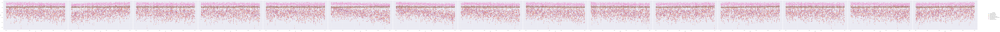

In [54]:
plot_and_save_single_polynomial_prediction_evaluation(lambda_net_test_dataset_list, 
                                                      function_values_test_list, 
                                                      polynomial_dict_test_list,
                                                      rand_index=index, 
                                                      plot_type=1)

In [55]:
plot_and_save_single_polynomial_prediction_evaluation(lambda_net_test_dataset_list, 
                                                      function_values_test_list, 
                                                      polynomial_dict_test_list,
                                                      rand_index=index, 
                                                      plot_type=2)

LinAlgError: Singular matrix

ValueError: 'bboxes' cannot be empty

<Figure size 0x0 with 256 Axes>

In [ ]:
plot_and_save_single_polynomial_prediction_evaluation(lambda_net_test_dataset_list, 
                                                      function_values_test_list, 
                                                      polynomial_dict_test_list,
                                                      rand_index=index, 
                                                      plot_type=3)

In [ ]:
STOP

# BENCHMARK (RANDOM GUESS) EVALUATION

In [ ]:
list_of_random_polynomials = np.random.uniform(low=-10, high=10, size=(len(lambda_net_test_dataset_list[-1]), sparsity))

In [ ]:
true_fv_test = parallel_fv_calculation_from_polynomial(lambda_net_test_dataset_list[-1].target_polynomial_list, lambda_net_test_dataset_list[-1].X_test_data_list, force_complete_poly_representation=True)
random_fv_test = parallel_fv_calculation_from_polynomial(list_of_random_polynomials, lambda_net_test_dataset_list[-1].X_test_data_list, force_complete_poly_representation=True)

In [ ]:
print('Random Guess Error Coefficients: ' + str(np.round(mean_absolute_error(lambda_net_test_dataset_list[-1].target_polynomial_list, list_of_random_polynomials), 4)))

In [ ]:
print('Random Guess Error FVs: ' + str(np.round(mean_absolute_error_function_values(true_fv_test, random_fv_test), 4)))

# BENCHMARK (EDUCATED GUESS/MEAN PREDICTION) EVALUATION

In [ ]:
true_fv_train = parallel_fv_calculation_from_polynomial(lambda_net_test_dataset_list[-1].target_polynomial_list, lambda_net_test_dataset_list[-1].X_test_data_list, force_complete_poly_representation=True)

mean_fv = np.mean(true_fv_train)
mean_fv_pred_test = [mean_fv for _ in range(true_fv_test.shape[0])]

In [ ]:
print('Educated Guess/Mean Prediction Error FVs: ' + str(np.round(mean_absolute_error_function_values(true_fv_test, mean_fv_pred_test), 4)))

In [ ]:
%%script false --no-raise-error

base_model = generate_base_model()
random_evaluation_dataset = np.random.uniform(low=x_min, high=x_max, size=(random_evaluation_dataset_size, n))
#random_evaluation_dataset = lambda_train_input_train_split[0]#lambda_train_input[0] #JUST [0] HERE BECAUSE EVALUATION ALWAYS ON THE SAME DATASET FOR ALL!!
list_of_monomial_identifiers_numbers = np.array([list(monomial_identifiers) for monomial_identifiers in list_of_monomial_identifiers]).astype(float)


loss_function = mean_absolute_error_tf_fv_lambda_extended_wrapper(random_evaluation_dataset, list_of_monomial_identifiers_numbers, base_model)      

X_train = X_train_list[-1].values[:,1:]
y_train = y_train_list[-1].values[:,2:]

#X_train = X_train[:,1:]
y_train_model = np.hstack((y_train, X_train))

print('seed_in_inet_training = ' + str(seed_in_inet_training), loss_function(y_train_model, y_train))


seed_in_inet_training = False

loss_function = mean_absolute_error_tf_fv_lambda_extended_wrapper(random_evaluation_dataset, list_of_monomial_identifiers_numbers, base_model)      

X_train = X_train_list[-1].values[:,1:]
y_train = y_train_list[-1].values[:,2:]

X_train = X_train[:,1:]
y_train_model = np.hstack((y_train, X_train))

print('seed_in_inet_training = ' + str(seed_in_inet_training), loss_function(y_train_model, y_train))

seed_in_inet_training = True



In [ ]:
lambda_net_test_dataset = lambda_net_test_dataset_list[-1]
current_jobs = 1

lr=0.5
max_steps = 100
early_stopping=10
restarts=2
per_network_dataset_size = 500

list_of_monomial_identifiers_numbers = np.array([list(monomial_identifiers) for monomial_identifiers in list_of_monomial_identifiers]).astype(float)  

if n_jobs != -1:
    n_jobs_per_network = min(n_jobs, os.cpu_count() // current_jobs)
else: 
    n_jobs_per_network = os.cpu_count() // current_jobs - 1

printing = True if n_jobs_per_network == 1 else False


lambda_network_weights_list = np.array(lambda_net_test_dataset.weight_list)
if evaluate_with_real_function: #target polynomial as inet target
    poly_representation_list = np.array(lambda_net_test_dataset.target_polynomial_list)
else: #lstsq lambda pred polynomial as inet target
    poly_representation_list = np.array(lambda_net_test_dataset.lstsq_lambda_pred_polynomial_list)


config = {
         'n': n,
         'inet_loss': inet_loss,
         'sparsity': sparsity,
         'lambda_network_layers': lambda_network_layers,
         'interpretation_net_output_shape': interpretation_net_output_shape,
         'RANDOM_SEED': RANDOM_SEED,
         'nas': nas,
         'number_of_lambda_weights': number_of_lambda_weights,
         'interpretation_net_output_monomials': interpretation_net_output_monomials,
         #'list_of_monomial_identifiers': list_of_monomial_identifiers,
         'x_min': x_min,
         'x_max': x_max,
         }


lambda_network_weights = lambda_network_weights_list[0]
poly_representation = poly_representation_list[0]



per_network_poly_optimization_tf(per_network_dataset_size, 
                                lambda_network_weights, 
                                  list_of_monomial_identifiers_numbers, 
                                  config, 
                                  lr=lr, 
                                  max_steps = max_steps, 
                                  early_stopping=early_stopping, 
                                  restarts=restarts, 
                                  printing=True)


# Evaluate Real Dataset


##  Auto MPG-Dataset

In [ ]:
interpretation_possible_autoMPG = False
print_head_autoMPG = None

url_autoMPG = 'http://archive.ics.uci.edu/ml/machine-learning-databases/auto-mpg/auto-mpg.data'
column_names_autoMPG = ['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
                'Acceleration', 'Model Year', 'Origin']

raw_dataset_autoMPG = pd.read_csv(url_autoMPG, names=column_names_autoMPG,
                          na_values='?', comment='\t',
                          sep=' ', skipinitialspace=True)

dataset_autoMPG = raw_dataset_autoMPG.dropna()

dataset_autoMPG['Origin'] = dataset_autoMPG['Origin'].map({1: 'USA', 2: 'Europe', 3: 'Japan'})
dataset_autoMPG = pd.get_dummies(dataset_autoMPG, columns=['Origin'], prefix='', prefix_sep='')


features_autoMPG = dataset_autoMPG.copy()

labels_autoMPG = features_autoMPG.pop('MPG')

features_autoMPG_normalized = (features_autoMPG-features_autoMPG.min())/(features_autoMPG.max()-features_autoMPG.min())

#labels_autoMPG = (labels_autoMPG-labels_autoMPG.min())/(labels_autoMPG.max()-labels_autoMPG.min())


if features_autoMPG_normalized.shape[1] >= n:
    if n == 1:
        features_autoMPG_model = features_autoMPG_normalized[['Horsepower']]
    elif n == features_autoMPG_normalized.shape[1]:
        features_autoMPG_model = features_autoMPG_normalized
    else:
        features_autoMPG_model = features_autoMPG_normalized.sample(n=n, axis='columns')
        
    print_head_autoMPG = features_autoMPG_model.head()
    interpretation_possible_autoMPG = True

print_head_autoMPG

In [ ]:
#%load_ext autoreload

In [ ]:
#%autoreload 2
if interpretation_possible_autoMPG:
    ((lambda_index_autoMPG, 
     current_seed_autoMPG, 
     polynomial_autoMPG, 
     polynomial_lstsq_pred_list_autoMPG, 
     polynomial_lstsq_true_list_autoMPG), 
    scores_list_autoMPG, 
    pred_list_autoMPG, 
    history_autoMPG, 
    model_autoMPG) = train_nn(lambda_index=0, 
                              X_data_lambda=features_autoMPG_model.values, 
                              y_data_real_lambda=labels_autoMPG.values, 
                              polynomial=None, 
                              seed_list=[RANDOM_SEED], 
                              callbacks=[PlotLossesKerasTF()], 
                              return_history=True, 
                              each_epochs_save=None, 
                              printing=False, 
                              return_model=True)
    
    polynomial_lstsq_pred_autoMPG = polynomial_lstsq_pred_list_autoMPG[-1]

In [ ]:
if interpretation_possible_autoMPG and n==1:
    x = tf.linspace(0.0, 250, 251)
    y = model_autoMPG.predict(x)

    plt.scatter(features_autoMPG_model['Horsepower'], labels_autoMPG, label='Data')
    plt.plot(x, y, color='k', label='Predictions')
    plt.xlabel('Horsepower')
    plt.ylabel('MPG')
    plt.legend()

In [ ]:
config = {
        'n': n,
        'd': d,
        'inet_loss': inet_loss,
        'sparsity': sparsity,
        'lambda_network_layers': lambda_network_layers,
        'interpretation_net_output_shape': interpretation_net_output_shape,
        'RANDOM_SEED': RANDOM_SEED,
        'nas': nas,
        'number_of_lambda_weights': number_of_lambda_weights,
        'interpretation_net_output_monomials': interpretation_net_output_monomials,
        'fixed_initialization_lambda_training': fixed_initialization_lambda_training,
        'dropout': dropout,
        'lambda_network_layers': lambda_network_layers,
        'optimizer_lambda': optimizer_lambda,
        'loss_lambda': loss_lambda,        
         #'list_of_monomial_identifiers': list_of_monomial_identifiers,
         'x_min': x_min,
         'x_max': x_max,
         }

weights_autoMPG = model_autoMPG.get_weights()

weights_flat_autoMPG = []
for layer_weights, biases in pairwise(weights_autoMPG):    #clf.get_weights()
    for neuron in layer_weights:
        for weight in neuron:
            weights_flat_autoMPG.append(weight)
    for bias in biases:
        weights_flat_autoMPG.append(bias)
        
weights_flat_autoMPG = np.array(weights_flat_autoMPG)


x = pred_list_autoMPG['X_test_lambda']
y = pred_list_autoMPG['y_test_real_lambda']

y_model_autoMPG = model_autoMPG.predict(x)




In [ ]:
if interpretation_possible_autoMPG:
    y_polynomial_lstsq_pred_autoMPG = calculate_function_values_from_polynomial(polynomial_lstsq_pred_autoMPG, x, force_complete_poly_representation=True)

    mae_model_polynomial_lstsq_pred_autoMPGy = mean_absolute_error(y_model_autoMPG, y_polynomial_lstsq_pred_autoMPG)
    mae_data_polynomial_lstsq_pred_autoMPG = mean_absolute_error(y, y_polynomial_lstsq_pred_autoMPG)

    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('LSTSQt Poly:')
    print_polynomial_from_coefficients(y_polynomial_lstsq_pred_autoMPG, force_complete_poly_representation=True)
    print('MAE Model: ', mae_model_polynomial_lstsq_pred_autoMPGy)
    print('MAE Data: ', mae_data_polynomial_lstsq_pred_autoMPG)
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')


In [ ]:
#%autoreload 2
if interpretation_possible_autoMPG:
    interpretation_net = model_list[-1]
    
    start = time.time() 
    
    #interpretation_net_poly = interpretation_net.predict(np.array([weights_flat_autoMPG]))[0]
    interpretation_net_poly = make_inet_prediction(interpretation_net, weights_flat_autoMPG, network_data=None, lambda_trained_normalized=False, inet_training_normalized=normalize_inet_data, normalization_parameter_dict=None)
    
    
    end = time.time()     
    generation_time = (end - start) 
    minutes, seconds = divmod(int(generation_time), 60)
    hours, minutes = divmod(minutes, 60)        
    
    y_interpretation_net_poly = calculate_function_values_from_polynomial(interpretation_net_poly, x, force_complete_poly_representation=False)
    
    mae_model_interpretation_net_poly = mean_absolute_error(y_model_autoMPG, y_interpretation_net_poly)
    mae_data_interpretation_net_poly = mean_absolute_error(y, y_interpretation_net_poly)
    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Interpretation Net Poly:')
    print_polynomial_from_coefficients(interpretation_net_poly, force_complete_poly_representation=False)
    print('MAE Model: ', mae_model_interpretation_net_poly)
    print('MAE Data: ', mae_data_interpretation_net_poly)    
    print('Computation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    

In [ ]:
if interpretation_possible_autoMPG:

    start = time.time() 
    
    if False:
        per_network_hyperparams = {
            'optimizer':  'Powell',
            'jac': 'fprime',
            'max_steps': 5000,#100,
            'restarts': 3,
            'per_network_dataset_size': 500,
        }      
        
        per_network_function =  per_network_poly_optimization_scipy(per_network_dataset_size, 
                                                                  weights_flat_autoMPG, 
                                                                  list_of_monomial_identifiers_numbers, 
                                                                  config, 
                                                                  optimizer = per_network_hyperparams['optimizer'],
                                                                  jac = per_network_hyperparams['jac'],
                                                                  max_steps = per_network_hyperparams['max_steps'], 
                                                                  restarts=per_network_hyperparams['restarts'], 
                                                                  printing=True,
                                                                  return_error=False)
    else:
        per_network_hyperparams = {
            'optimizer': tf.keras.optimizers.RMSprop,
            'lr': 0.02,
            'max_steps': 500,
            'early_stopping': 10,
            'restarts': 3,
            'per_network_dataset_size': 5000,
        }   
        
        per_network_function =  per_network_poly_optimization_tf(per_network_hyperparams['per_network_dataset_size'], 
                                                              weights_flat_autoMPG, 
                                                              list_of_monomial_identifiers_numbers, 
                                                              config, 
                                                              optimizer = per_network_hyperparams['optimizer'],
                                                              lr=per_network_hyperparams['lr'], 
                                                              max_steps = per_network_hyperparams['max_steps'], 
                                                              early_stopping=per_network_hyperparams['early_stopping'], 
                                                              restarts=per_network_hyperparams['restarts'], 
                                                              printing=True,
                                                              return_error=False)
            
    end = time.time()     
    generation_time = (end - start) 
    minutes, seconds = divmod(int(generation_time), 60)
    hours, minutes = divmod(minutes, 60)  
    
    y_per_network_function = calculate_function_values_from_polynomial(per_network_function, x, force_complete_poly_representation=False)
    
    mae_model_interpretation_net_poly = mean_absolute_error(y_model_autoMPG, y_per_network_function)
    mae_data_interpretation_net_poly = mean_absolute_error(y, y_per_network_function)    
    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Per Network Poly:')
    print_polynomial_from_coefficients(per_network_function)
    print('MAE Model: ', mae_model_interpretation_net_poly)
    print('MAE Data: ', mae_data_interpretation_net_poly)       
    print('Computation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')


In [ ]:
#%load_ext autoreload

In [ ]:
#%autoreload 2
if interpretation_possible_autoMPG:
    
    symbolic_regression_hyperparams = {
        'dataset_size': 500,
    }

    start = time.time() 
    
    symbolic_regression_function =  symbolic_regression(model_autoMPG, 
                                                      config,
                                                      symbolic_regression_hyperparams,
                                                      #printing = True,
                                                      return_error = False)
    
    end = time.time()     
    generation_time = (end - start) 
    minutes, seconds = divmod(int(generation_time), 60)
    hours, minutes = divmod(minutes, 60)        
    
    variable_names = ['X' + str(i) for i in range(n)]
    
    y_symbolic_regression_function = calculate_function_values_from_sympy(symbolic_regression_function, x, variable_names=variable_names)
    
    mae_model_symbolic_regression_function = mean_absolute_error(y_model_autoMPG, y_symbolic_regression_function)
    mae_data_symbolic_regression_function = mean_absolute_error(y, y_symbolic_regression_function)
    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Symbolic Regression Poly:')    
    display(symbolic_regression_function)
    print('MAE Model: ', mae_model_symbolic_regression_function)
    print('MAE Data: ', mae_data_symbolic_regression_function)      
    print('Computation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    

In [ ]:
#%autoreload 2
if interpretation_possible_autoMPG and True:
    metamodeling_hyperparams = {
        'num_iter': 500,
        'batch_size': None,
        'learning_rate': 0.01,        
        'dataset_size': 500,
    }
    
    start = time.time() 

    metamodel_function =  symbolic_metamodeling(model_autoMPG, 
                                              config,
                                              metamodeling_hyperparams,
                                              #printing = True,
                                              return_error = False,
                                              return_expression = 'approx', #'approx', #'exact',
                                              function_metamodeling = False,
                                              force_polynomial=False)
    
    end = time.time()     
    generation_time = (end - start) 
    minutes, seconds = divmod(int(generation_time), 60)
    hours, minutes = divmod(minutes, 60)        
    
    y_metamodel_function = calculate_function_values_from_sympy(metamodel_function, x)
    
    mae_model_metamodel_function = mean_absolute_error(y_model_autoMPG, y_metamodel_function)
    mae_data_metamodel_function = mean_absolute_error(y, y_metamodel_function)
    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Metamodel Function:')    
    display(metamodel_function)
    print('MAE Model: ', mae_model_metamodel_function)
    print('MAE Data: ', mae_data_metamodel_function)      
    print('Computation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    

In [ ]:
if interpretation_possible_autoMPG and False:
    metamodeling_hyperparams = {
        'num_iter': 500,
        'batch_size': None,
        'learning_rate': 0.01,        
        'dataset_size': 500,
    }
    
    start = time.time() 

    metamodel_function_basic =  symbolic_metamodeling(model_autoMPG, 
                                              config,
                                              metamodeling_hyperparams,
                                              #printing = True,
                                              return_error = False,
                                              return_expression = 'approx', #'approx', #'exact',
                                              function_metamodeling = True,
                                              force_polynomial=False)
    
    end = time.time()     
    generation_time = (end - start) 
    minutes, seconds = divmod(int(generation_time), 60)
    hours, minutes = divmod(minutes, 60)        
    
    y_metamodel_function_basic = calculate_function_values_from_sympy(metamodel_function_basic, x)
    
    mae_metamodel_function_basic = mean_absolute_error(y_model_autoMPG, y_metamodel_function_basic)
    mae_metamodel_function_basic = mean_absolute_error(y, y_metamodel_function_basic)
    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Metamodel Function Basic:')    
    display(metamodel_function_basic)
    print('MAE Model: ', mae_metamodel_function_basic)
    print('MAE Data: ', mae_metamodel_function_basic)      
    print('Computation Time: ' +  f'{hours:d}:{minutes:02d}:{seconds:02d}')    
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    

In [ ]:
if interpretation_possible_autoMPG:
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Interpretation Net Poly:')
    print_polynomial_from_coefficients(interpretation_net_poly, force_complete_poly_representation=False)
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Per Network Poly:')
    print_polynomial_from_coefficients(per_network_function, force_complete_poly_representation=False)
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('LSTSQ Poly:')
    print_polynomial_from_coefficients(polynomial_lstsq_pred_autoMPG, force_complete_poly_representation=True)
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Symbolic Regression Function:')
    display(symbolic_regression_function)
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('Metamodel Function:')
    display(metamodel_function)
    #print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    #print('Metamodel Function Basic:')
    #display(metamodel_function_basic)
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print('------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------')


In [ ]:
if interpretation_possible_autoMPG and n==1:
    fig, ax = plt.subplots(1, 1, figsize=(20,10))
    
    ax.set_ylim([0,50])
    
    plt.scatter(features_autoMPG_model['Horsepower'], labels_autoMPG, label='Data')
    plt.scatter(x, y, label='Test Data')
    plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y_model_autoMPG))]) , label='Model Predictions')
    plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y_interpretation_net_poly))]) , label='Interpretation Net Poly')
    #plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y_per_network_function))]) , label='Per Network Poly')
    plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y_polynomial_lstsq_pred_autoMPG))]) , label='LSTSQ Poly')
    plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y_symbolic_regression_function))]) , label='Symbolic Regression Function')
    #plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y_metamodel_function))]) , label='Metamodel Function')
    #plt.plot(np.sort(x, axis=0), np.array([y for _, y in sorted(zip(x, y))]) y_metamodel_function_basic, label='Metamodel Function Basic')
    plt.xlabel('Horsepower')
    plt.ylabel('MPG')
    plt.legend()

In [ ]:
sample_data_X = np.array([i for i in range(1000)])
sample_data_y = np.array([3*i for i in range(1000)])

current_seed = 42

In [ ]:
random.seed(current_seed)
np.random.seed(current_seed)
if int(tf.__version__[0]) >= 2:
    tf.random.set_seed(current_seed)
else:
    tf.set_random_seed(current_seed) 
    
model = keras.models.Sequential()

model.add(Dense(5, input_shape=(1,), activation='relu'))
model.add(Dense(3, activation='relu'))
model.add(Dense(1))

model.compile(loss='mae', optimizer='adam')
          
    
model.summary()

model.fit(sample_data_X,
         sample_data_y,
         epochs=5000,
         verbose=0)

print(model.get_weights())

print(model.predict([1, 10]))

In [ ]:
random.seed(current_seed)
np.random.seed(current_seed)
if int(tf.__version__[0]) >= 2:
    tf.random.set_seed(current_seed)
else:
    tf.set_random_seed(current_seed) 
    
model = keras.models.Sequential()

model.add(Dense(5, input_shape=(1,), activation='relu'))
model.add(Dense(3, activation='relu'))
model.add(Dense(1))

model.compile(loss='mae', optimizer='adam')
          
    
model.summary()

model.fit(sample_data_X,
         sample_data_y*1000,
         epochs=5000,
         verbose=0)

print(model.get_weights())

print(model.predict([1, 10]))

In [ ]:
random.seed(current_seed)
np.random.seed(current_seed)
if int(tf.__version__[0]) >= 2:
    tf.random.set_seed(current_seed)
else:
    tf.set_random_seed(current_seed) 
    
model = keras.models.Sequential()

model.add(Dense(5, input_shape=(1,), activation='relu'))
model.add(Dense(3, activation='relu'))
model.add(Dense(1))

model.compile(loss='mae', optimizer='adam')
          
    
model.summary()

model.fit(sample_data_X,
         sample_data_y+1000,
         epochs=5000,
         verbose=0)

print(model.get_weights())

print(model.predict([1, 10]))

In [ ]:


model_2_weights = model.get_weights()
model_2_normalized_weights = model_2_weights #[weights/10 for weights in model_2_weights]


model_2_normalized_weights[-6] = model_2_normalized_weights[-6]/10
model_2_normalized_weights[-5] = model_2_normalized_weights[-5]/10

model_2_normalized_weights[-4] = model_2_normalized_weights[-4]/10
model_2_normalized_weights[-3] = model_2_normalized_weights[-3]/100

model_2_normalized_weights[-2] = model_2_normalized_weights[-2]/10
model_2_normalized_weights[-1] = model_2_normalized_weights[-1]/1000

model_2.set_weights(model_2_normalized_weights)

print(model_2.get_weights())
print(model_2.predict([1, 10]))

# Evaluate Per-Network Poly Optimization

## Example Optimization (Common Optimizer)

In [ ]:
random_index = RANDOM_SEED

per_network_hyperparams = {
    'optimizer':  'Powell',
    'jac': 'fprime',
    'max_steps': 5000,#100,
    'restarts': 3,
    'per_network_dataset_size': 500,
}

lambda_net_test_dataset = lambda_net_test_dataset_list[-1]
lambda_network_weights_list = np.array(lambda_net_test_dataset.weight_list)
lambda_network_weights = lambda_network_weights_list[random_index]

list_of_monomial_identifiers_numbers = np.array([list(monomial_identifiers) for monomial_identifiers in list_of_monomial_identifiers]).astype(float)  

printing = True

config = {
         'n': n,
         'inet_loss': inet_loss,
         'sparsity': sparsity,
         'lambda_network_layers': lambda_network_layers,
         'interpretation_net_output_shape': interpretation_net_output_shape,
         'RANDOM_SEED': RANDOM_SEED,
         'nas': nas,
         'number_of_lambda_weights': number_of_lambda_weights,
         'interpretation_net_output_monomials': interpretation_net_output_monomials,
         'x_min': x_min,
         'x_max': x_max,
         }


per_network_optimization_error, per_network_optimization_polynomial = per_network_poly_optimization_scipy(per_network_hyperparams['per_network_dataset_size'], 
                                                                                                      lambda_network_weights, 
                                                                                                      list_of_monomial_identifiers_numbers, 
                                                                                                      config,
                                                                                                      optimizer = per_network_hyperparams['optimizer'],
                                                                                                      jac = per_network_hyperparams['jac'],
                                                                                                      max_steps = per_network_hyperparams['max_steps'], 
                                                                                                      restarts = per_network_hyperparams['restarts'],
                                                                                                      printing = True,
                                                                                                      return_error = True)

print('\n\nError: ' + str(per_network_optimization_error))
print_polynomial_from_coefficients(per_network_optimization_polynomial)



## Example Optimization (Neural Optimizer)

In [ ]:
random_index = RANDOM_SEED

per_network_hyperparams = {
    'optimizer': tf.keras.optimizers.RMSprop,
    'lr': 0.02,
    'max_steps': 500,
    'early_stopping': 10,
    'restarts': 3,
    'per_network_dataset_size': 5000,
}

lambda_net_test_dataset = lambda_net_test_dataset_list[-1]
lambda_network_weights_list = np.array(lambda_net_test_dataset.weight_list)
lambda_network_weights = lambda_network_weights_list[random_index]

list_of_monomial_identifiers_numbers = np.array([list(monomial_identifiers) for monomial_identifiers in list_of_monomial_identifiers]).astype(float)  

printing = True

config = {
         'n': n,
         'inet_loss': inet_loss,
         'sparsity': sparsity,
         'lambda_network_layers': lambda_network_layers,
         'interpretation_net_output_shape': interpretation_net_output_shape,
         'RANDOM_SEED': RANDOM_SEED,
         'nas': nas,
         'number_of_lambda_weights': number_of_lambda_weights,
         'interpretation_net_output_monomials': interpretation_net_output_monomials,
         'x_min': x_min,
         'x_max': x_max,
         }


per_network_optimization_error, per_network_optimization_polynomial = per_network_poly_optimization_tf(per_network_hyperparams['per_network_dataset_size'], 
                                                                                                      lambda_network_weights, 
                                                                                                      list_of_monomial_identifiers_numbers, 
                                                                                                      config,
                                                                                                      optimizer = per_network_hyperparams['optimizer'],
                                                                                                      lr = per_network_hyperparams['lr'], 
                                                                                                      max_steps = per_network_hyperparams['max_steps'], 
                                                                                                      early_stopping = per_network_hyperparams['early_stopping'], 
                                                                                                      restarts = per_network_hyperparams['restarts'],
                                                                                                      printing = True,
                                                                                                      return_error = True)

print('\n\nError: ' + str(per_network_optimization_error.numpy()))
print_polynomial_from_coefficients(per_network_optimization_polynomial)



## Grid Search Common Optimizers

In [ ]:
%%script false --no-raise-error

pd.set_option('max_colwidth', 100)

evaluation_size = 10

per_network_hyperparams = {
    'optimizer':  [
                   'Nelder-Mead', 
                   'Powell', 
        
                   'CG',
                   'BFGS',
                   'Newton-CG', 
                   #'L-BFGS-B', #'>' not supported between instances of 'int' and 'NoneType'
                   'TNC', 
                   
                   'COBYLA', 
                   'SLSQP', 
                   
                   #'trust-constr', # TypeError: _minimize_trustregion_constr() got an unexpected keyword argument 'maxfun'
                   #'dogleg', # ValueError: Hessian is required for dogleg minimization
                   #'trust-ncg', #ValueError: Either the Hessian or the Hessian-vector product is required for Newton-CG trust-region minimization
                   #'trust-exact', # ValueError: Hessian matrix is required for trust region exact minimization.
                   #'trust-krylov' #ValueError: Either the Hessian or the Hessian-vector product is required for Krylov trust-region minimization
                   ], 
    'jac': ['fprime'],
    'max_steps': [5000],#100,
    'restarts': [3],
    'per_network_dataset_size': [500],
}

#param_iterator = ParameterSampler(per_network_hyperparams, n_iter=60, random_state=RANDOM_SEED)
param_iterator = ParameterGrid(per_network_hyperparams)


lambda_net_test_dataset = lambda_net_test_dataset_list[-1]
lambda_network_weights_list = np.array(lambda_net_test_dataset.weight_list)

list_of_monomial_identifiers_numbers = np.array([list(monomial_identifiers) for monomial_identifiers in list_of_monomial_identifiers]).astype(float)  
printing = True if n_jobs == 1 else False

config = {
         'n': n,
         'inet_loss': inet_loss,
         'sparsity': sparsity,
         'lambda_network_layers': lambda_network_layers,
         'interpretation_net_output_shape': interpretation_net_output_shape,
         'RANDOM_SEED': RANDOM_SEED,
         'nas': nas,
         'number_of_lambda_weights': number_of_lambda_weights,
         'interpretation_net_output_monomials': interpretation_net_output_monomials,
         'x_min': x_min,
         'x_max': x_max,
         }

In [ ]:
%%script false --no-raise-error

params_error_list = []
for params in tqdm(param_iterator):
    parallel_per_network = Parallel(n_jobs=n_jobs, verbose=0, backend='loky')

    result_list = parallel_per_network(delayed(per_network_poly_optimization_scipy)(params['per_network_dataset_size'], 
                                                                                  lambda_network_weights, 
                                                                                  list_of_monomial_identifiers_numbers, 
                                                                                  config,
                                                                                  optimizer = params['optimizer'],
                                                                                  jac = params['jac'],
                                                                                  max_steps = params['max_steps'], 
                                                                                  restarts = params['restarts'],
                                                                                  printing = printing,
                                                                                  return_error = True) for lambda_network_weights in lambda_network_weights_list[:evaluation_size])  
    
    
    per_network_optimization_errors = [result[0] for result in result_list]
    per_network_optimization_polynomials = [result[1] for result in result_list]
        
    params_score = np.mean(per_network_optimization_errors)
    
    evaluation_result = list(params.values())
    evaluation_result.append(params_score)
    
    params_error_list.append(evaluation_result)
        
    del parallel_per_network

columns = list(params.keys())
columns.append('score')
params_error_df = pd.DataFrame(data=params_error_list, columns=columns).sort_values(by='score')
params_error_df.head(10) 

## Grid Search Neural Optimizers

In [ ]:
%%script false --no-raise-error

pd.set_option('max_colwidth', 100)

evaluation_size = 100

per_network_hyperparams = {
    'optimizer': [tf.keras.optimizers.RMSprop], #[tf.keras.optimizers.SGD, tf.optimizers.Adam, tf.keras.optimizers.RMSprop, tf.keras.optimizers.Adadelta]
    'lr': [0.02], #[0.5, 0.25, 0.1, 0.05, 0.025]
    'max_steps': [5000],#100,
    'early_stopping': [10],
    'restarts': [3],
    'per_network_dataset_size': [5000],
}

#param_iterator = ParameterSampler(per_network_hyperparams, n_iter=60, random_state=RANDOM_SEED)
param_iterator = ParameterGrid(per_network_hyperparams)


lambda_net_test_dataset = lambda_net_test_dataset_list[-1]
lambda_network_weights_list = np.array(lambda_net_test_dataset.weight_list)

list_of_monomial_identifiers_numbers = np.array([list(monomial_identifiers) for monomial_identifiers in list_of_monomial_identifiers]).astype(float)  
printing = True if n_jobs == 1 else False

config = {
         'n': n,
         'inet_loss': inet_loss,
         'sparsity': sparsity,
         'lambda_network_layers': lambda_network_layers,
         'interpretation_net_output_shape': interpretation_net_output_shape,
         'RANDOM_SEED': RANDOM_SEED,
         'nas': nas,
         'number_of_lambda_weights': number_of_lambda_weights,
         'interpretation_net_output_monomials': interpretation_net_output_monomials,
         'x_min': x_min,
         'x_max': x_max,
         }

In [ ]:
%%script false --no-raise-error

params_error_list = []
for params in tqdm(param_iterator):
    parallel_per_network = Parallel(n_jobs=n_jobs, verbose=0, backend='loky')

    result_list = parallel_per_network(delayed(per_network_poly_optimization_tf)(params['per_network_dataset_size'], 
                                                                                  lambda_network_weights, 
                                                                                  list_of_monomial_identifiers_numbers, 
                                                                                  config,
                                                                                  optimizer = params['optimizer'],
                                                                                  lr = params['lr'], 
                                                                                  max_steps = params['max_steps'], 
                                                                                  early_stopping = params['early_stopping'], 
                                                                                  restarts = params['restarts'],
                                                                                  printing = printing,
                                                                                  return_error = True) for lambda_network_weights in lambda_network_weights_list[:evaluation_size])  
    
    
    per_network_optimization_errors = [result[0] for result in result_list]
    per_network_optimization_polynomials = [result[1] for result in result_list]
        
    params_score = np.mean(per_network_optimization_errors)
    
    evaluation_result = list(params.values())
    evaluation_result.append(params_score)
    
    params_error_list.append(evaluation_result)
        
    del parallel_per_network

columns = list(params.keys())
columns.append('score')
params_error_df = pd.DataFrame(data=params_error_list, columns=columns).sort_values(by='score')
params_error_df.head(10) 

In [ ]:
if use_gpu:
    from numba import cuda 
    device = cuda.get_current_device()
    device.reset()